# Loading Libraries

In [1]:
import pandas as pd
import numpy as np
import datetime

import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px

import seaborn as sns
from matplotlib import rcParams
import plotly.graph_objects as go

import matplotlib.pyplot as plt

sns.set()

import warnings
warnings.filterwarnings('ignore')

# Loading Data

In [2]:
pd.set_option('display.max_columns',None)
data = pd.read_csv('covid.csv', parse_dates=['entry_date','date_symptoms'], dayfirst=True)

In [3]:
data.describe(include = "all")

,id,sex,patient_type,entry_date,date_symptoms,date_died,intubed,pneumonia,age,pregnancy,diabetes,copd,asthma,inmsupr,hypertension,other_disease,cardiovascular,obesity,renal_chronic,tobacco,contact_other_covid,covid_res,icu
count,566602,566602.000000,566602.000000,566602,566602,566602,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000,566602.000000
unique,563201,NaN,NaN,181,181,124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,0.00E+00,NaN,NaN,2020-06-15 00:00:00,2020-06-01 00:00:00,9999-99-99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,210,NaN,NaN,13261,13860,530426,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,NaN,NaN,NaN,2020-01-01 00:00:00,2020-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,2020-06-29 00:00:00,2020-06-29 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1.506726,1.215165,NaN,NaN,NaN,76.562952,1.846262,42.622483,50.400692,2.210633,2.280221,2.265029,2.319628,2.145774,2.410030,2.286157,2.138905,2.283765,2.238360,31.573034,1.728651,76.562864
std,NaN,0.499955,0.410937,NaN,NaN,NaN,39.058676,0.560939,16.659973,47.501579,5.683523,5.327832,5.334658,5.667381,5.459866,6.489959,5.438405,5.395578,5.393232,5.571901,45.082123,0.658710,39.059060
min,NaN,1.000000,1.000000,NaN,NaN,NaN,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,NaN,1.000000,1.000000,NaN,NaN,NaN,97.000000,2.000000,31.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,97.000000


In [4]:
#data = data.replace(2,0)
data.loc[:, data.columns != 'age'] = data.loc[:, data.columns != 'age'].replace(2,0)

In [5]:
data.head()

,id,sex,patient_type,entry_date,date_symptoms,date_died,intubed,pneumonia,age,pregnancy,diabetes,copd,asthma,inmsupr,hypertension,other_disease,cardiovascular,obesity,renal_chronic,tobacco,contact_other_covid,covid_res,icu
0,16169f,0,1,2020-05-04,2020-05-02,9999-99-99,97,0,27,97,0,0,0,0,0,0,0,0,0,0,0,1,97
1,1009bf,0,1,2020-03-19,2020-03-17,9999-99-99,97,0,24,97,0,0,0,0,0,0,0,0,0,0,99,1,97
2,167386,1,0,2020-04-06,2020-04-01,9999-99-99,0,0,54,0,0,0,0,0,0,0,0,1,0,0,99,1,0
3,0b5948,0,0,2020-04-17,2020-04-10,9999-99-99,0,1,30,97,0,0,0,0,0,0,0,0,0,0,99,1,0
4,0d01b5,1,0,2020-04-13,2020-04-13,22-04-2020,0,0,60,0,1,0,0,0,1,0,1,0,0,0,99,1,0


## CORRELATION HEATMAP

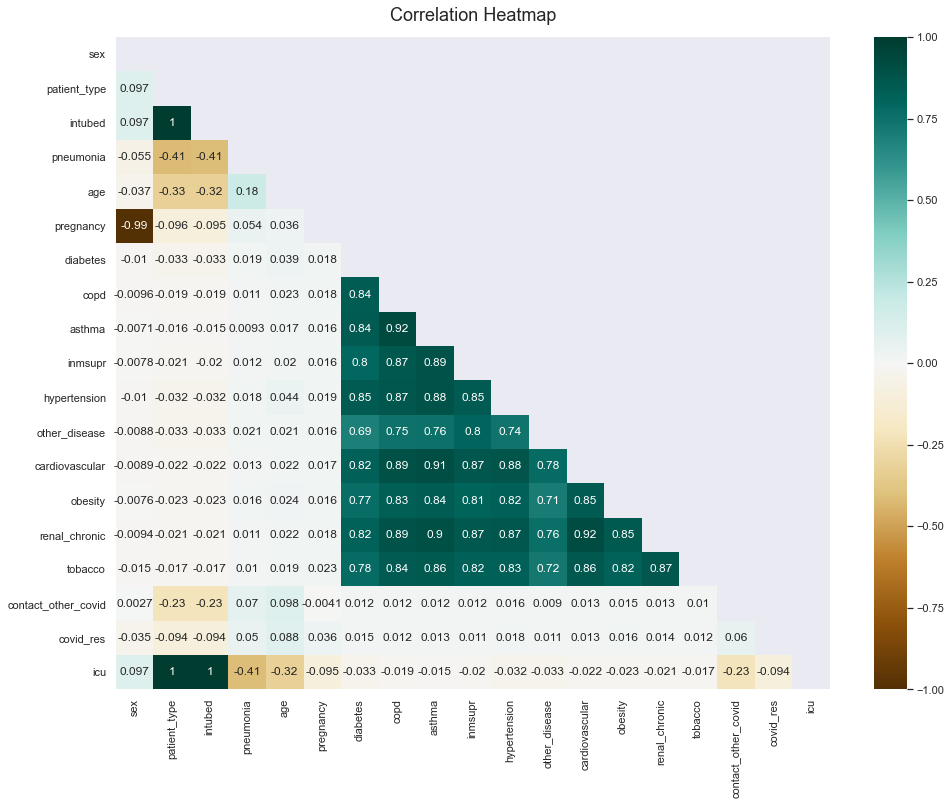

In [6]:
plt.figure(figsize=(16, 12))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(data.corr(), dtype=bool))
heatmap = sns.heatmap(data.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

Above correlation heatmap shows that there is high correlation among patients medical pre-conditions

# Data Cleaning

In [7]:
# copy original data to new dataframe df
df = data.copy()

In [8]:
# Checking data Types
df.dtypes

id                             object
sex                             int64
patient_type                    int64
entry_date             datetime64[ns]
date_symptoms          datetime64[ns]
date_died                      object
intubed                         int64
pneumonia                       int64
age                             int64
pregnancy                       int64
diabetes                        int64
copd                            int64
asthma                          int64
inmsupr                         int64
hypertension                    int64
other_disease                   int64
cardiovascular                  int64
obesity                         int64
renal_chronic                   int64
tobacco                         int64
contact_other_covid             int64
covid_res                       int64
icu                             int64
dtype: object

In [9]:
df=df[['id', 'sex', 'patient_type', 'entry_date', 'date_symptoms', 'date_died', 'age',
       'intubed', 'pneumonia', 'pregnancy', 'diabetes', 'copd', 'asthma', 'inmsupr',
       'hypertension', 'other_disease', 'cardiovascular', 'obesity', 'renal_chronic', 
       'tobacco','covid_res','icu']]

df.rename(columns={'covid_res':'Test_result'},inplace=True)
df.iloc[:,7:]=df.iloc[:,7:].replace([97,98,99],np.nan)

df['pregnancy'].replace(np.nan,0, inplace = True)  # replacing missing pregnancy=NaN for male

df = df.loc[df['Test_result'] != 3] # removing awaiting results

# patient survived if date_died == '9999-99-99'
df['death'] = df['date_died'].apply(lambda x: 0 if x == '9999-99-99' else 1)

In [10]:
def age_band(age):
    
   
    if age<2:
        return 'Less than 2'
    elif (age>1) and (age<11):
        return '2-10'
    elif (age>10 and age<21):
        return '10-20'
    elif (age>20 and age<31):
        return '20-30'
    elif (age>30 and age<41):
        return '30-40'
    elif (age>40 and age<51):
        return '40-50'
    elif (age>50 and age<61):
        return '50-60'
    elif (age>60 and age<81):
        return '60-80'
    else:
        return 'Above 80'

In [11]:
df['Age_Category']=df['age'].apply(age_band)
df['Count']=1
df = df.drop(['age'],axis = 1)

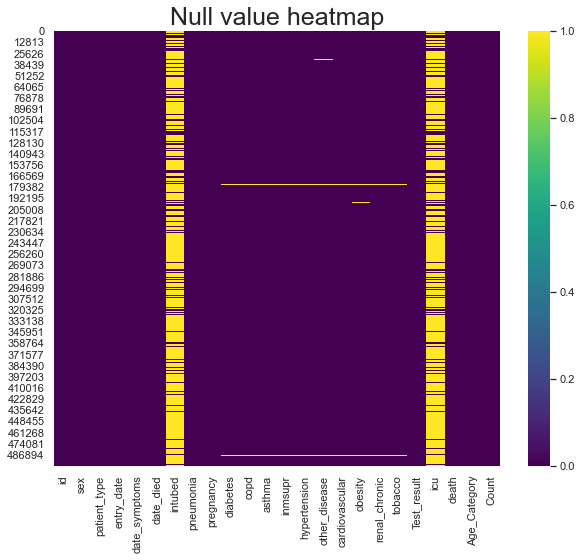

In [12]:
plt.figure(figsize=(10,8))
sns.heatmap(df.isnull(),cmap='viridis')
plt.title('Null value heatmap',size=25)
plt.show()

As we can see from the above heatmap, high number of null values can bee seen in intubed and ICU features. Rest of the values don't seem to have much.

In [13]:
# drop all na values 

df = df.dropna(axis = 0)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105959 entries, 2 to 499688
Data columns (total 24 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   id              105959 non-null  object        
 1   sex             105959 non-null  int64         
 2   patient_type    105959 non-null  int64         
 3   entry_date      105959 non-null  datetime64[ns]
 4   date_symptoms   105959 non-null  datetime64[ns]
 5   date_died       105959 non-null  object        
 6   intubed         105959 non-null  float64       
 7   pneumonia       105959 non-null  float64       
 8   pregnancy       105959 non-null  float64       
 9   diabetes        105959 non-null  float64       
 10  copd            105959 non-null  float64       
 11  asthma          105959 non-null  float64       
 12  inmsupr         105959 non-null  float64       
 13  hypertension    105959 non-null  float64       
 14  other_disease   105959 non-null  flo

In [15]:
# converting float columns back to int

for col in ['intubed', 'pneumonia', 'pregnancy', 'diabetes', 'copd',\
       'asthma', 'inmsupr', 'hypertension', 'other_disease', 'cardiovascular',\
       'obesity', 'renal_chronic', 'tobacco', 'Test_result', 'icu']:    
    df[col] = df[col].apply(np.int64)

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105959 entries, 2 to 499688
Data columns (total 24 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   id              105959 non-null  object        
 1   sex             105959 non-null  int64         
 2   patient_type    105959 non-null  int64         
 3   entry_date      105959 non-null  datetime64[ns]
 4   date_symptoms   105959 non-null  datetime64[ns]
 5   date_died       105959 non-null  object        
 6   intubed         105959 non-null  int64         
 7   pneumonia       105959 non-null  int64         
 8   pregnancy       105959 non-null  int64         
 9   diabetes        105959 non-null  int64         
 10  copd            105959 non-null  int64         
 11  asthma          105959 non-null  int64         
 12  inmsupr         105959 non-null  int64         
 13  hypertension    105959 non-null  int64         
 14  other_disease   105959 non-null  int

# Time series Trend Analysis

*Let's understand the trend for patients requiring ICU and the columns we are interested are:*

- entry_date
- date_symptoms
- date_died

In [16]:
df_icu = df.loc[df['icu'] == 1]

In [17]:
df_icu.date_died = df_icu.date_died.replace("9999-99-99",datetime.datetime(1900,1,1))
df_icu.date_died = pd.to_datetime(df_icu.date_died, dayfirst=True, errors='coerce')
df_icu['died'] = np.where(df_icu['date_died'] == datetime.datetime(1900,1,1),False,True)
df_icu['entry_symptoms_dates'] = ((df_icu['entry_date'] - df_icu['date_symptoms'])/ np.timedelta64(1, 'D')).astype(int)
df_icu['died_entry_dates'] = ((df_icu['date_died'] - df_icu['entry_date'])/ np.timedelta64(1, 'D')).astype(int)
df_icu['died_symptoms_dates'] = ((df_icu['date_died'] - df_icu['date_symptoms'])/ np.timedelta64(1, 'D')).astype(int)

In [18]:
symptoms_by_date = df_icu.groupby('date_symptoms')['id'].agg('count').to_frame(name='count')
deaths_by_date = df_icu.groupby('date_died')['id'].agg('count').to_frame(name='count')
entry_by_date = df_icu.groupby('entry_date')['id'].agg('count').to_frame(name='count')

deaths_by_date = deaths_by_date[1:]
colort = '#456213'
color1 = '#9467bd'
color2 = '#2367ff'
color3 = '#15dd88'

trace1 = go.Scatter(x = deaths_by_date.index, y = deaths_by_date['count'], name='Deaths by Date', line = dict( color = color1))
trace2 = go.Scatter(x = symptoms_by_date.index, y = symptoms_by_date['count'], name='Symptoms by Date', line = dict(  color = color2 ) )
trace3 = go.Scatter(x = entry_by_date.index, y = entry_by_date['count'], name='Entry by Date', line = dict(color = color3 ) )

data = [trace1,trace2,trace3]
layout = go.Layout(title= "Cases by day (Jan- Jun 2020)", yaxis=dict(title='Number of deaths', titlefont=dict(color=colort), tickfont=dict(color=colort)))
fig = go.Figure(data=data, layout=layout)
plot_url = py.iplot(fig)

<font size="+1" color="darkred">Insights: </font>

* Peaks and downs in symptoms and hospital admissions are in sync (very intuitive). 
* Deaths have been peaking from mid March and in between small dips and highest number of deaths on June 10. (93 deaths)

In [19]:
sdates_df = df_icu.groupby(['died_symptoms_dates']).agg('count')['id'].to_frame(name='count').reset_index()
entry_bool = sdates_df['died_symptoms_dates'] >= 0
sdates_df = sdates_df[entry_bool]
fig = px.scatter(sdates_df, x="died_symptoms_dates", y="count",
                 color="count", color_continuous_scale=px.colors.sequential.Viridis)
fig.update_layout(title="Number of days patients lived from Symptoms to Death ",title_x=0.5,xaxis=dict(title="Days"),yaxis=dict(title="Number of Patients"))
fig.show()

<font size="+1" color="darkred">Insights: </font>

* Around 20 patients died on same day that they noticed symptoms and got admitted. This seems strange. It could be they mistook the underlying conditions that escalated it.
* Patients who died after suffering a month is below 30. This could be because they had milder virus and the medical attention over weeks was working well to bring down deaths.
* There are around 230 patients who died in 8 days delta (difference between death and symptoms). Between 4 - 16 days (difference between death and symptoms), the number of patients who died sees a peak (up from around 150 - 230 patients). It is likely that medical care given was not proper or there were some other conditions that could not salvage the death. 

In [20]:
ddates_df = df_icu.groupby(['died_entry_dates']).agg('count')['id'].to_frame(name='count').reset_index()
entry_bool = ddates_df['died_entry_dates'] >= 0
ddates_df = ddates_df[entry_bool]
fig = px.scatter(ddates_df, x="died_entry_dates", y="count",
                 color="count", color_continuous_scale=px.colors.sequential.Viridis)
fig.update_layout(title="Number of days patients lived between Admission to Death ",title_x=0.5,xaxis=dict(title="Days"),yaxis=dict(title="Number of Patients"))
fig.show()

<font size="+1" color="darkred">Insights: </font>

* There are 273 patients died on same day that they got admitted. This seems strange. It is likely that they came in late and they could have come earlier.
* There are around 374 people who died a day later, this seems a situation where they had co-morbidities that spiralled out of control.
* We can see graph going down  meaning the longer they are in the hospital the number of patients who died is reducing. It is likely that medical care given was working and medical team is in control of the situation. 

In [21]:
dates_df = df_icu.groupby(['entry_symptoms_dates']).agg('count')['id'].to_frame(name='count').reset_index()
fig = px.scatter(dates_df, x="entry_symptoms_dates", y="count",
                 color="count", color_continuous_scale=px.colors.sequential.Viridis)
fig.update_layout(title="Number of days between - When Symptoms appeared to Hospital Admissions",title_x=0.5,xaxis=dict(title="Days"),yaxis=dict(title="Number of Patients"))
fig.show()

<font size="+1" color="darkred">Insights: </font>

* There are 1272 patients who got admitted on the same day they saw symptoms. The symptoms probably were very strong that they immediately sought a hospital admission.
* There are around 900 people who got admitted in a hospital everyday, from day 1 to day 7 of symptoms.
* We can see graph going down  meaning patients admitted within a week is high and admissions tapers down as the patients are dealing with symptoms longer- maybe on their own.
* After 2 weeks of symptoms, there has just been a case or two admissions in the hospitals. The virus must have been tackled within 2 weeks.

In [22]:
negative_result_bool = (df_icu['Test_result'] == 0) 
positive_result_bool = (df_icu['Test_result'] == 1)
pne_bool = (df_icu['pneumonia'] == 1)
intubed_bool = (df_icu['intubed'] == 1)
copd_bool = (df_icu['copd'] == 1) 
tobacco_bool = (df_icu['tobacco'] == 1)
asthma_bool = (df_icu['asthma'] == 1)
sex_bool = (df_icu['sex'] == 1) 
preg_bool = (df_icu['pregnancy'] == 1) 
inmsupr_bool = (df_icu['inmsupr'] == 1)
obesity_bool = (df_icu['obesity'] == 1)
hypertension_bool = (df_icu['hypertension'] == 1)
cardiovascular_bool = (df_icu['cardiovascular'] == 1)
renal_chronic_bool = (df_icu['renal_chronic'] == 1)
other_disease_bool = (df_icu['other_disease'] == 1)
diabetes_bool = (df_icu['diabetes'] == 1)
non_diabetes_bool = (df_icu['diabetes'] == 1)
died_bool = df_icu['died'] == True
not_died_bool = df_icu['died'] == False

In [23]:
fig = go.Figure()
x11 = df_icu[positive_result_bool].shape[0]
x12 = df_icu[positive_result_bool & pne_bool].shape[0]
x13 = df_icu[positive_result_bool & pne_bool & intubed_bool].shape[0]
x14 = df_icu[positive_result_bool & pne_bool & intubed_bool & tobacco_bool].shape[0]
x15 = df_icu[positive_result_bool & pne_bool & intubed_bool & copd_bool & tobacco_bool].shape[0]
x16 = df_icu[positive_result_bool & pne_bool & intubed_bool & asthma_bool & tobacco_bool & copd_bool].shape[0]
x17 = df_icu[positive_result_bool & pne_bool & intubed_bool & asthma_bool & tobacco_bool & copd_bool & hypertension_bool].shape[0]

x21 = df_icu[negative_result_bool].shape[0]
x22 = df_icu[negative_result_bool & pne_bool].shape[0]
x23 = df_icu[negative_result_bool & pne_bool & intubed_bool].shape[0]
x24 = df_icu[negative_result_bool & pne_bool & intubed_bool & tobacco_bool].shape[0]
x25 = df_icu[negative_result_bool & pne_bool & intubed_bool & copd_bool & tobacco_bool].shape[0]
x26 = df_icu[negative_result_bool & pne_bool & intubed_bool & asthma_bool & tobacco_bool & copd_bool].shape[0]
x27 = df_icu[positive_result_bool & pne_bool & intubed_bool & asthma_bool & tobacco_bool & copd_bool & hypertension_bool].shape[0]

fig.add_trace(go.Funnel(
    name = 'Positive',
    y = ["Covid Result", "Pneumonia", "Intubed",'Tobacco',"COPD", 'Asthma', "Hypertension"],
    x = [x11, x12, x13, x14, x15, x16, x17], textinfo = "value+percent initial"))

fig.add_trace(go.Funnel(
    name = 'Negative', orientation = "h",
    y = ["Covid Result", "Pneumonia", "Intubed", 'Tobacco',"COPD", 'Asthma', "Hypertension"],
    x = [x21, x22, x23, x24, x25, x26, x27],
    textposition = "inside", textinfo = "value+percent previous"))

fig.update_layout(title="ICU Patients who have most common preconditions ",title_x=0.35,xaxis=dict(title="Number of Patients"),yaxis=dict(title="Preconditions"))
fig.show()

**As we can see in the above visualization the distribution of ICU patients who have usual conditions is as follows:-**
    
* Let us look at Lung related diseases or infections because corona virus is known to decapacitate the lungs.
* There were 8768 ICU patients. 5667 patients are COVID +ve and 3101 patients are COVID-ve.
* There are around 88% of COVID positive have pneumonia, similarly 74% of COVID negative have pneumonia. 
* Around 53% of above pneumonia positive people needed intubation.
* Around 4% of the above people who needed intubation, use tobacco.
* Around .4% of the above people who use tobacco have COPD issues.
* A very miniscule percentage of people who have COPD issues have asthma and further have hypertension.
* So net-net, Pneumonia appears like a strong reason to need ICU whether the COVID result is positive or negative

In [24]:
fig = go.Figure()

x21 = df_icu[negative_result_bool].shape[0]
x22 = df_icu[negative_result_bool & ~pne_bool].shape[0]
x23 = df_icu[negative_result_bool & ~pne_bool & ~intubed_bool].shape[0]
x24 = df_icu[negative_result_bool & ~pne_bool & ~intubed_bool & ~hypertension_bool].shape[0]
x25 = df_icu[negative_result_bool & ~pne_bool & ~intubed_bool  & ~hypertension_bool & ~diabetes_bool].shape[0]
x26 = df_icu[negative_result_bool & ~pne_bool & ~intubed_bool  & ~hypertension_bool & ~diabetes_bool & ~obesity_bool].shape[0]

fig.add_trace(go.Funnel(
    name = 'Negative', orientation = "h",
    y = ["Covid Results - Negative", "No Pneumonia", "No Intubation Required", 'No hypertension','No diabetes',"No obesity"],
    x = [x21, x22, x23, x24, x25, x26],
    textposition = "inside",
    textinfo = "value+percent previous"))

fig.update_layout(title="ICU Patients who did not have usual preconditions ",title_x=0.35,xaxis=dict(title="Number of Patients"),yaxis=dict(title="Preconditions"))

fig.show()

**As we can see in the above visualization the distribution of ICU patients who did not have usual conditions is as follows:-**

- Around 26% of COVID negative have no pneumonia (primary reason to have an ICU admission), similarly 20% of COVID awaiting results have no pneumonia.
- Around 80% of above pneumonia negative people needed NO intubation.
- Around 76% of the above people who needed no intubation, have no hypertension.
- Around 90% of the above people who have no hypertension have no diabetes.
- Around 93% of the above people who have no diabetes have no obesity either.
- So net-net, 406 patients who tested covid negative - are free of usual suspects (preconditions /co-morbidities)

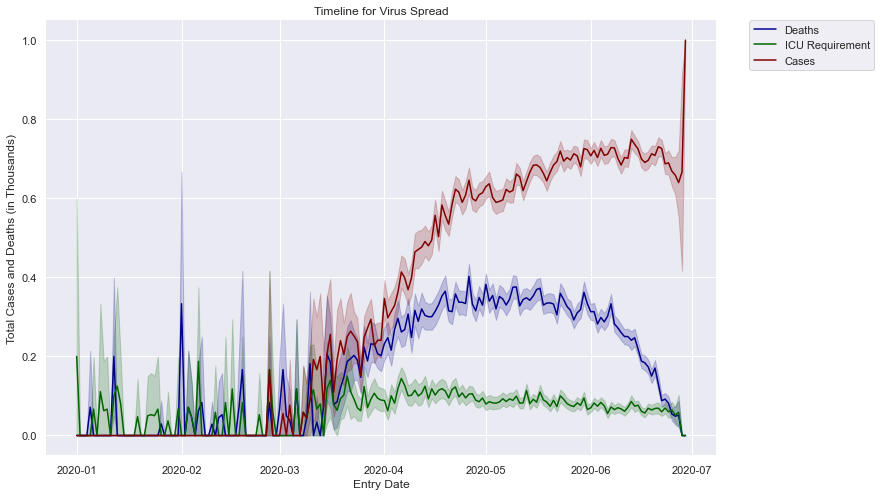

In [25]:
plt.figure(figsize=(12,8))
sns.lineplot(x='entry_date', y='death', data=df, color='darkblue', label='Deaths')
sns.lineplot(x='entry_date', y='icu', data=df, color='darkgreen', label='ICU Requirement')
de= sns.lineplot(x='entry_date', y='Test_result', data=df, color='maroon', label='Cases')
de.set_xlabel('Entry Date')
de.set_ylabel('Total Cases and Deaths (in Thousands)')
de.set_title ('Timeline for Virus Spread')
sns.despine(left=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

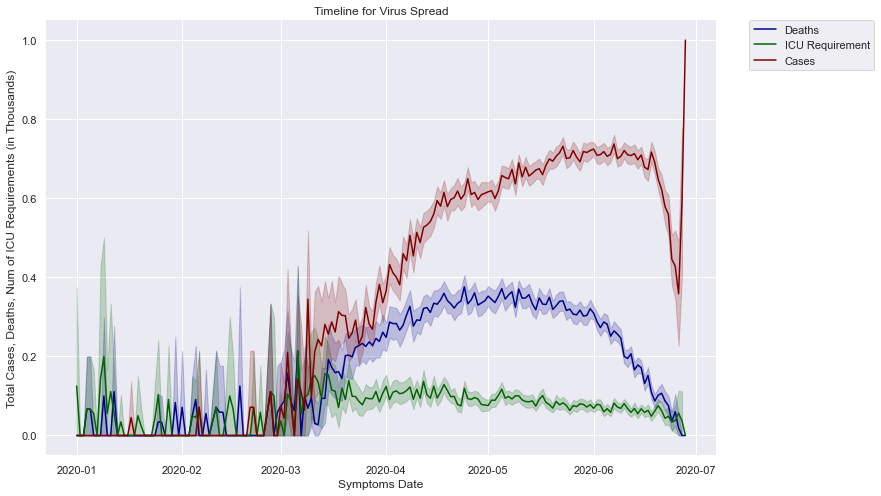

In [26]:
plt.figure(figsize=(12,8))
sns.lineplot(x='date_symptoms', y='death', data=df, color='darkblue', label='Deaths')
sns.lineplot(x='date_symptoms', y='icu', data=df, color='darkgreen', label='ICU Requirement')
de= sns.lineplot(x='date_symptoms', y='Test_result', data=df, color='maroon', label='Cases')
de.set_xlabel('Symptoms Date')
de.set_ylabel('Total Cases, Deaths, Num of ICU Requirements (in Thousands)')
de.set_title ('Timeline for Virus Spread')
sns.despine(left=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

<font size="+1" color="darkred">Insights from above two Visualizations: </font>

- From the peaks and downs in the ICU requirement and death cases and constant 0 for Covid cases suggests that they are due to other co-morbidities the patients must be having.  
- Increase in ICU requirement as increase in Covid Cases and Deaths.
- The sudden rise in the Covid cases somewhere around start of July could be due to 2nd wave that had appeared.
- Inspite of sudden rise in the Covid cases, we see consistent decrease in deaths.
- Increase in ICU requirement has a constant flow and seems to be decreasing slowly.

**Below we have visualized count plots for Patient's pre-conditions and how they vary for ICU, Covid and Death -**

Text(0.5, 1.0, 'Reported intubations \n \n  Ratio=11')

<Figure size 720x576 with 0 Axes>

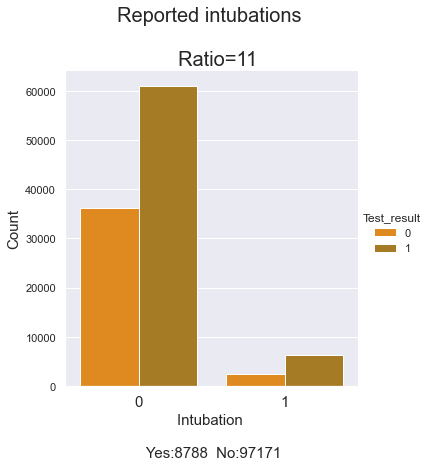

In [27]:
plt.figure(figsize=(10,8))
ax=sns.catplot('intubed',data=df,kind='count',palette='autumn_d',hue='Test_result')
plt.xticks(size=15,)
plt.xlabel('Intubation \n \n Yes:{}  No:{}'.format(df['intubed'].value_counts()[1] , df['intubed'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported intubations \n \n  Ratio={0:.0f}'.format(df['intubed'].value_counts()[0]/df['intubed'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Intubations \n \n  Ratio=11')

<Figure size 720x576 with 0 Axes>

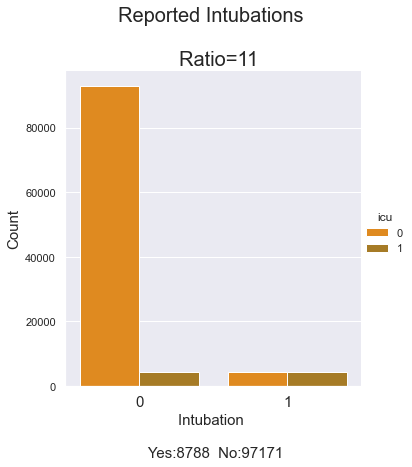

In [28]:
plt.figure(figsize=(10,8))
ax=sns.catplot('intubed',data=df,kind='count',palette='autumn_d',hue='icu')
plt.xticks(size=15,)
plt.xlabel('Intubation \n \n Yes:{}  No:{}'.format(df['intubed'].value_counts()[1] , df['intubed'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Intubations \n \n  Ratio={0:.0f}'.format(df['intubed'].value_counts()[0]/df['intubed'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Pregnancies \n \n  Ratio=109')

<Figure size 720x576 with 0 Axes>

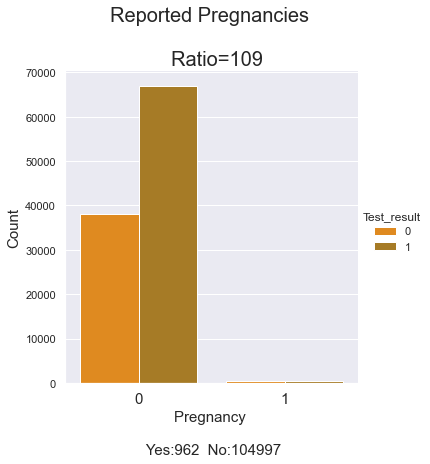

In [29]:
plt.figure(figsize=(10,8))
ax=sns.catplot('pregnancy',data=df,kind='count',palette='autumn_d',hue='Test_result')
plt.xticks(size=15,)
plt.xlabel('Pregnancy \n \n Yes:{}  No:{}'.format(df['pregnancy'].value_counts()[1] , df['pregnancy'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Pregnancies \n \n  Ratio={0:.0f}'.format(df['pregnancy'].value_counts()[0]/df['pregnancy'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Pregnancies \n \n  Ratio=109')

<Figure size 720x576 with 0 Axes>

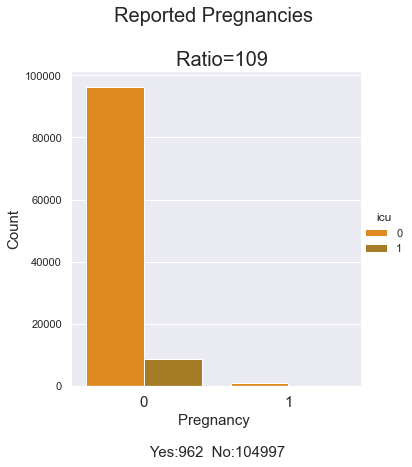

In [30]:
plt.figure(figsize=(10,8))
ax=sns.catplot('pregnancy',data=df,kind='count',palette='autumn_d',hue='icu')
plt.xticks(size=15,)
plt.xlabel('Pregnancy \n \n Yes:{}  No:{}'.format(df['pregnancy'].value_counts()[1] , df['pregnancy'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Pregnancies \n \n  Ratio={0:.0f}'.format(df['pregnancy'].value_counts()[0]/df['pregnancy'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Pneumonia Cases \n \n  Ratio=1')

<Figure size 720x576 with 0 Axes>

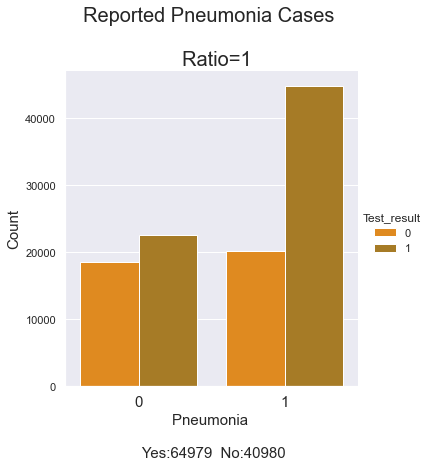

In [31]:
plt.figure(figsize=(10,8))
ax=sns.catplot('pneumonia',data=df,kind='count',palette='autumn_d',hue='Test_result')
plt.xticks(size=15,)
plt.xlabel('Pneumonia \n \n Yes:{}  No:{}'.format(df['pneumonia'].value_counts()[1] , df['pneumonia'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Pneumonia Cases \n \n  Ratio={0:.0f}'.format(df['pneumonia'].value_counts()[0]/df['pneumonia'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Pneumonia Cases \n \n  Ratio=1')

<Figure size 720x576 with 0 Axes>

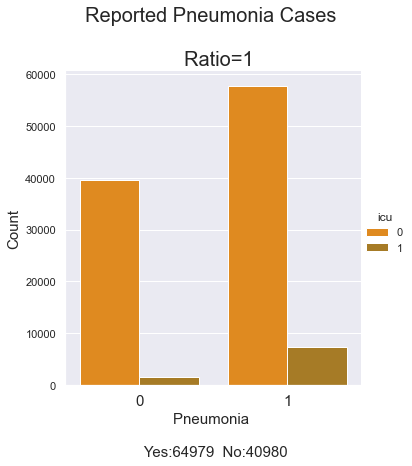

In [32]:
plt.figure(figsize=(10,8))
ax=sns.catplot('pneumonia',data=df,kind='count',palette='autumn_d',hue='icu')
plt.xticks(size=15,)
plt.xlabel('Pneumonia \n \n Yes:{}  No:{}'.format(df['pneumonia'].value_counts()[1] , df['pneumonia'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Pneumonia Cases \n \n  Ratio={0:.0f}'.format(df['pneumonia'].value_counts()[0]/df['pneumonia'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Diabetes Cases \n \n  Ratio=2')

<Figure size 720x576 with 0 Axes>

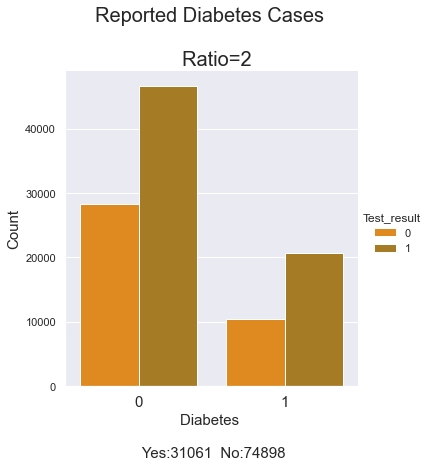

In [33]:
plt.figure(figsize=(10,8))
ax=sns.catplot('diabetes',data=df,kind='count',palette='autumn_d',hue='Test_result')
plt.xticks(size=15,)
plt.xlabel('Diabetes \n \n Yes:{}  No:{}'.format(df['diabetes'].value_counts()[1] , df['diabetes'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Diabetes Cases \n \n  Ratio={0:.0f}'.format(df['diabetes'].value_counts()[0]/df['diabetes'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Diabetes Cases \n \n  Ratio=2')

<Figure size 720x576 with 0 Axes>

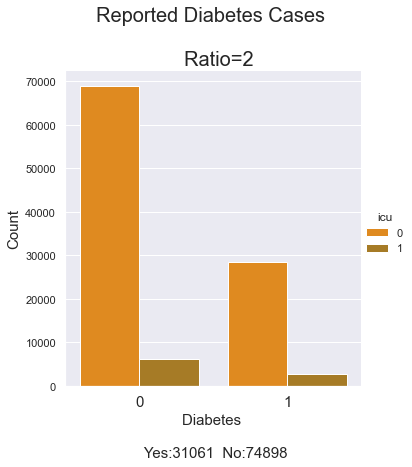

In [34]:
plt.figure(figsize=(10,8))
ax=sns.catplot('diabetes',data=df,kind='count',palette='autumn_d',hue='icu')
plt.xticks(size=15,)
plt.xlabel('Diabetes \n \n Yes:{}  No:{}'.format(df['diabetes'].value_counts()[1] , df['diabetes'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Diabetes Cases \n \n  Ratio={0:.0f}'.format(df['diabetes'].value_counts()[0]/df['diabetes'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Renal Chronic Cases \n \n  Ratio=15')

<Figure size 720x576 with 0 Axes>

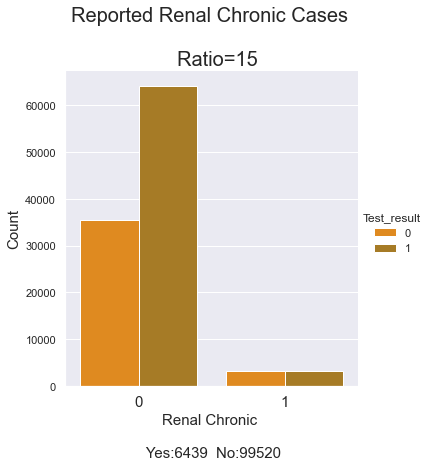

In [35]:
plt.figure(figsize=(10,8))
ax=sns.catplot('renal_chronic',data=df,kind='count',palette='autumn_d',hue='Test_result')
plt.xticks(size=15,)
plt.xlabel('Renal Chronic \n \n Yes:{}  No:{}'.format(df['renal_chronic'].value_counts()[1] , df['renal_chronic'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Renal Chronic Cases \n \n  Ratio={0:.0f}'.format(df['renal_chronic'].value_counts()[0]/df['renal_chronic'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Renal Chronic Cases \n \n  Ratio=15')

<Figure size 720x576 with 0 Axes>

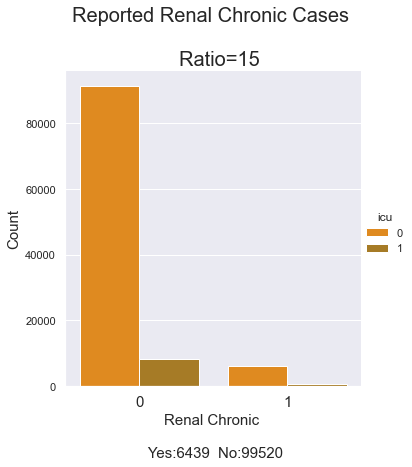

In [36]:
plt.figure(figsize=(10,8))
ax=sns.catplot('renal_chronic',data=df,kind='count',palette='autumn_d',hue='icu')
plt.xticks(size=15,)
plt.xlabel('Renal Chronic \n \n Yes:{}  No:{}'.format(df['renal_chronic'].value_counts()[1] , df['renal_chronic'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Renal Chronic Cases \n \n  Ratio={0:.0f}'.format(df['renal_chronic'].value_counts()[0]/df['renal_chronic'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Chronic obstructive pulmonary Cases \n \n  Ratio=20')

<Figure size 720x576 with 0 Axes>

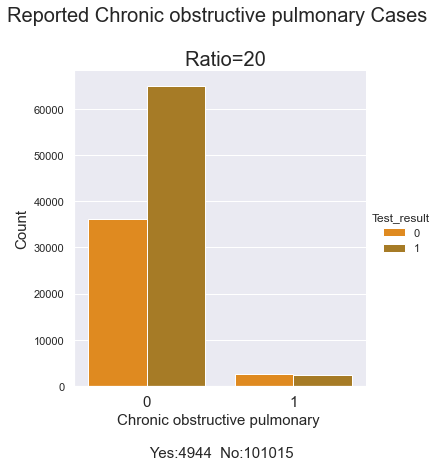

In [37]:
plt.figure(figsize=(10,8))
ax=sns.catplot('copd',data=df,kind='count',palette='autumn_d',hue='Test_result')
plt.xticks(size=15,)
plt.xlabel('Chronic obstructive pulmonary \n \n Yes:{}  No:{}'.format(df['copd'].value_counts()[1] , df['copd'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Chronic obstructive pulmonary Cases \n \n  Ratio={0:.0f}'.format(df['copd'].value_counts()[0]/df['copd'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Chronic obstructive pulmonary Cases \n \n  Ratio=20')

<Figure size 720x576 with 0 Axes>

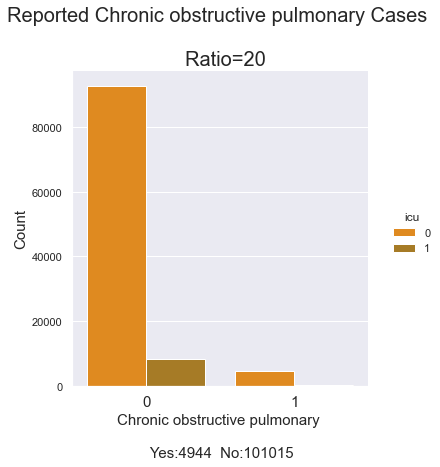

In [38]:
plt.figure(figsize=(10,8))
ax=sns.catplot('copd',data=df,kind='count',palette='autumn_d',hue='icu')
plt.xticks(size=15,)
plt.xlabel('Chronic obstructive pulmonary \n \n Yes:{}  No:{}'.format(df['copd'].value_counts()[1] , df['copd'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Chronic obstructive pulmonary Cases \n \n  Ratio={0:.0f}'.format(df['copd'].value_counts()[0]/df['copd'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported hypertension Cases \n \n  Ratio=2')

<Figure size 720x576 with 0 Axes>

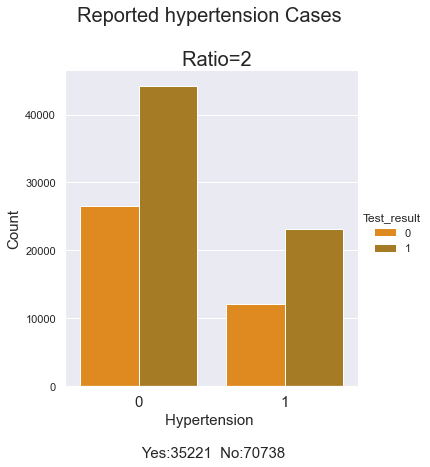

In [39]:
plt.figure(figsize=(10,8))
ax=sns.catplot('hypertension',data=df,kind='count',palette='autumn_d',hue='Test_result')
plt.xticks(size=15,)
plt.xlabel('Hypertension \n \n Yes:{}  No:{}'.format(df['hypertension'].value_counts()[1] , df['hypertension'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported hypertension Cases \n \n  Ratio={0:.0f}'.format(df['hypertension'].value_counts()[0]/df['hypertension'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported hypertension Cases \n \n  Ratio=2')

<Figure size 720x576 with 0 Axes>

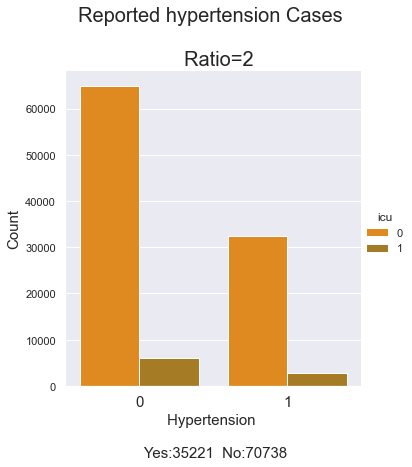

In [40]:
plt.figure(figsize=(10,8))
ax=sns.catplot('hypertension',data=df,kind='count',palette='autumn_d',hue='icu')
plt.xticks(size=15,)
plt.xlabel('Hypertension \n \n Yes:{}  No:{}'.format(df['hypertension'].value_counts()[1] , df['hypertension'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported hypertension Cases \n \n  Ratio={0:.0f}'.format(df['hypertension'].value_counts()[0]/df['hypertension'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Covid Cases \n \n  Ratio=1')

<Figure size 720x576 with 0 Axes>

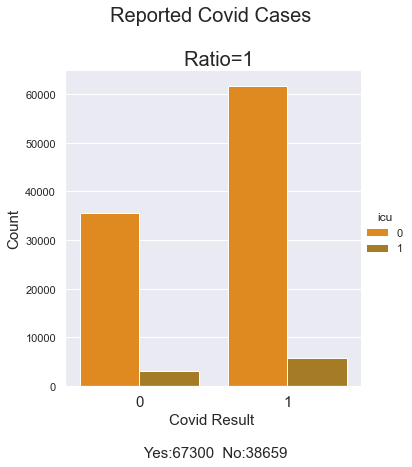

In [41]:
plt.figure(figsize=(10,8))
ax=sns.catplot('Test_result',data=df,kind='count',palette='autumn_d',hue='icu')
plt.xticks(size=15,)
plt.xlabel('Covid Result \n \n Yes:{}  No:{}'.format(df['Test_result'].value_counts()[1] , df['Test_result'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Covid Cases \n \n  Ratio={0:.0f}'.format(df['Test_result'].value_counts()[0]/df['Test_result'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Covid Cases \n \n  Ratio=1')

<Figure size 720x576 with 0 Axes>

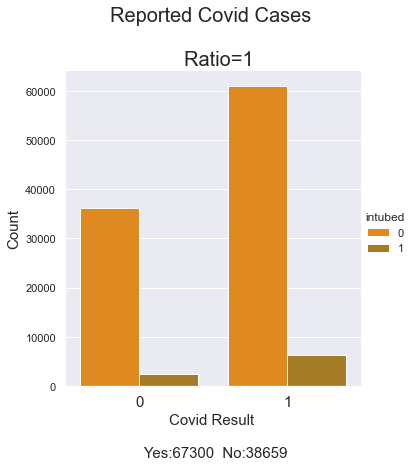

In [42]:
plt.figure(figsize=(10,8))
ax=sns.catplot('Test_result',data=df,kind='count',palette='autumn_d',hue='intubed')
plt.xticks(size=15,)
plt.xlabel('Covid Result \n \n Yes:{}  No:{}'.format(df['Test_result'].value_counts()[1] , df['Test_result'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Covid Cases \n \n  Ratio={0:.0f}'.format(df['Test_result'].value_counts()[0]/df['Test_result'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Covid Cases \n \n  Ratio=1')

<Figure size 720x576 with 0 Axes>

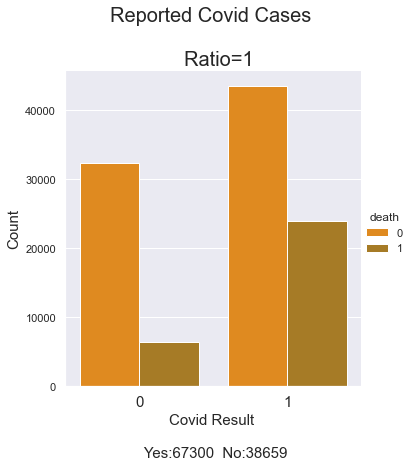

In [43]:
plt.figure(figsize=(10,8))
ax=sns.catplot('Test_result',data=df,kind='count',palette='autumn_d',hue='death')
plt.xticks(size=15,)
plt.xlabel('Covid Result \n \n Yes:{}  No:{}'.format(df['Test_result'].value_counts()[1] , df['Test_result'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Covid Cases \n \n  Ratio={0:.0f}'.format(df['Test_result'].value_counts()[0]/df['Test_result'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Diabetes Cases \n \n  Ratio=2')

<Figure size 720x576 with 0 Axes>

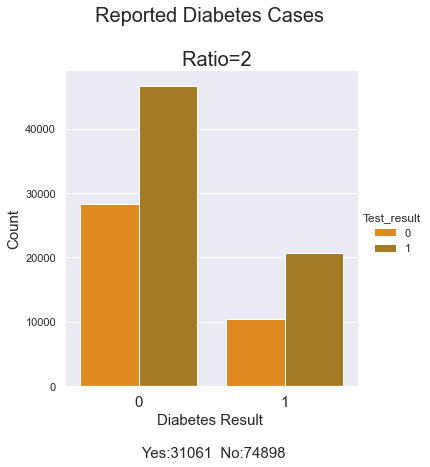

In [44]:
plt.figure(figsize=(10,8))
ax=sns.catplot('diabetes',data=df,kind='count',palette='autumn_d',hue='Test_result')
plt.xticks(size=15,)
plt.xlabel('Diabetes Result \n \n Yes:{}  No:{}'.format(df['diabetes'].value_counts()[1] , df['diabetes'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Diabetes Cases \n \n  Ratio={0:.0f}'.format(df['diabetes'].value_counts()[0]/df['diabetes'].value_counts()[1])
          ,size=20)

Text(0.5, 1.0, 'Reported Diabetes Cases \n \n  Ratio=2')

<Figure size 720x576 with 0 Axes>

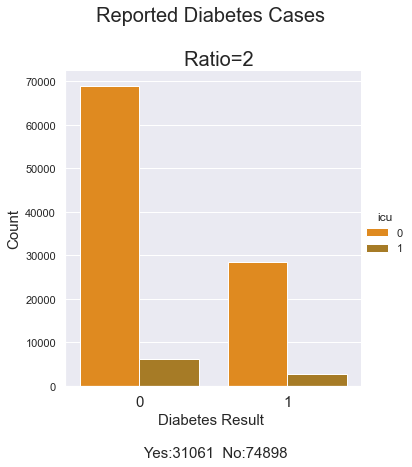

In [45]:
plt.figure(figsize=(10,8))
ax=sns.catplot('diabetes',data=df,kind='count',palette='autumn_d',hue='icu')
plt.xticks(size=15,)
plt.xlabel('Diabetes Result \n \n Yes:{}  No:{}'.format(df['diabetes'].value_counts()[1] , df['diabetes'].value_counts()[0]),size=15)
plt.ylabel('Count',size=15)
plt.title('Reported Diabetes Cases \n \n  Ratio={0:.0f}'.format(df['diabetes'].value_counts()[0]/df['diabetes'].value_counts()[1])
          ,size=20)

These count plots give us better understanding over patients requiring ICU. We can see and thus speculate that Patients with pre-conditions such as Pneumonia, Intubations because of surgery, or Covid have a high chance of ICU requirement.  

**Let’s understand the fatality rate distribution with respect to different Age groups.**

Text(0.5, 1.0, 'COVID +ve case fatality with respect to age groups')

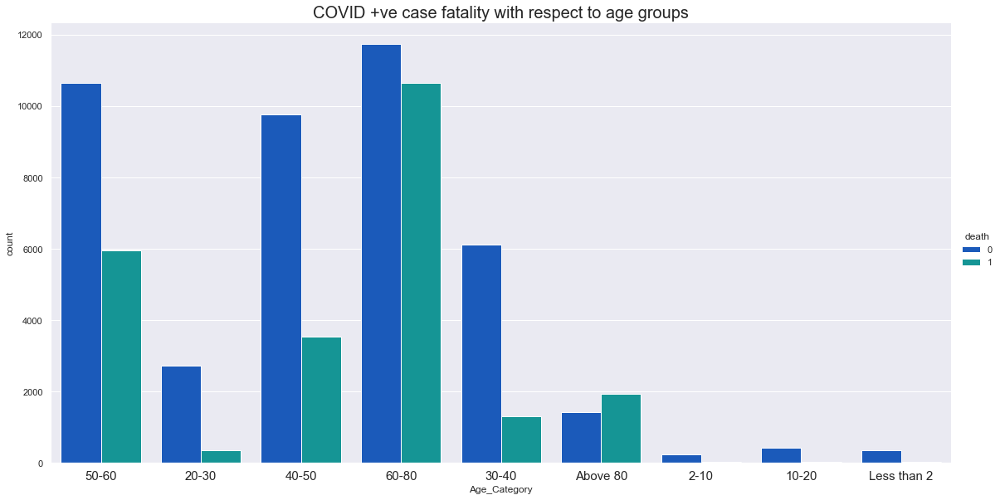

In [46]:
df_pos=df[df['Test_result']== 1]
sns.catplot('Age_Category',kind='count',hue='death',data=df_pos,height=8,aspect=2,palette='winter')

plt.xticks(size=15)

plt.title('COVID +ve case fatality with respect to age groups',size=20)

As we can see from the above distribution of Age Category, Elderly people and senior citizens in the age range of 50 to 80 have the highest fatality rate because of Covid.

**Let's understand the counts of Mortality, Icu Requirement and Covid as these are features of interest in order to proceed with Machine Learning Models**

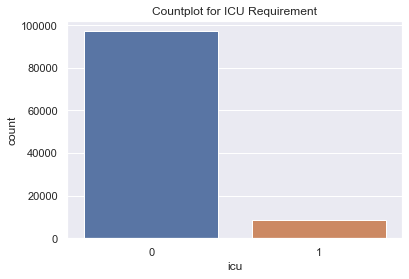

In [47]:
sns.countplot(df.icu)
plt.title('Countplot for ICU Requirement')
plt.show()

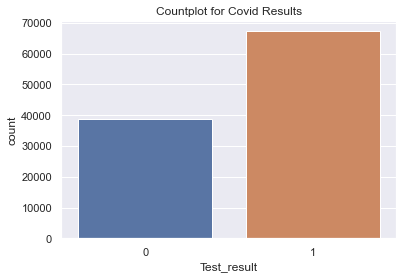

In [48]:
sns.countplot(df.Test_result)
plt.title('Countplot for Covid Results')
plt.show()

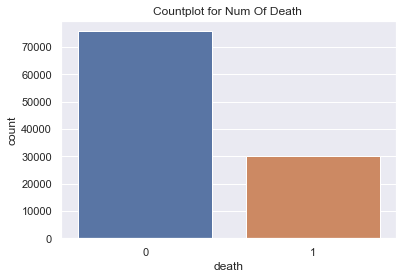

In [49]:
sns.countplot(df.death)
plt.title('Countplot for Num Of Death ')
plt.show()

# Machine Learning Models

Below are the 4 supervised machine learning algorithms that we have used to classify ***ICU requirements, likelihood of testing positive and factors that affect fatality rate.***

- Logistic Regression: L1 and L2 penalty on the cost 

- Decision Trees: Tuning Impurity, No. of trees and max tree depth

- Random Forest: Tuning Impurity, No. of trees and max tree depth

- Gradient Boosting: Tuning Impurity, No. of trees and max tree depth


Hyperparameter tuning was performed on each model using ***grid search and 3-fold cross validation***. Since the classes were imbalanced, we tried to focus more on precision and recall. We have used sklearn for building models. Below, we present the best performing model and important features in each case as well as consolidated results at the end. 

We decided to build above models using below case statements in order to better understand the ICU requirements based on patients who have died and are still hospitalized, utilizing various pre-conditions as a basis: -

- Case1: Predicting death for patients requiring ICU

- Case2: Predicting death for patients not requiring ICU

- Case3: Predicting ICU for died patients

- Case4: Predicting ICU for hospitalized patients

- Case5: Predicting Covid


***Using the results obtained from above cases and exploratory analysis will help us to give suggestions to the hospital on how to handle the patient's ICU requirement of ICU based on certain pre-conditions.***


In [50]:
# Importing Logistic Regression, Decision Trees, Random Forest and Gradient Boosting from Sklearn Model
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

## Using GridSearchCV with 3-fold Cross Validation With Hyperparameter Tuning

In [51]:
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV

from sklearn.metrics import classification_report, plot_confusion_matrix, accuracy_score

In [52]:
def hypertuning(model, params, n_iter, X,y):
    print('Tuning Hyperparameters.....')
    gridSearch = GridSearchCV(estimator=model, param_grid=params, cv = 3, n_jobs=-1, \
                                      ) # 3 fold CV.
    #n_iter=n_iter
    gridSearch.fit(X,y) # Using train data with 3-fold cross validation to tune hyperparameters
    best_parameters = gridSearch.best_params_
    best_score = gridSearch.best_score_
    return best_parameters, best_score

In [53]:
# Hyperparameters of Logistic Regression for Tunning purposes
log_reg = LogisticRegression(random_state = 42)

log_reg_params = {
    'penalty': ['l1','l2','elasticnet']
    , 'C': [0.4,0.6,0.8,1,1.1]
    , 'solver': ['lbfgs', 'liblinear', 'sag', 'saga']
    , 'l1_ratio': [0,0.01,0.02,0.1,0.4,0.8,1]
}

In [54]:
# Hyperparameters of Decision Trees for Tunning purposes
dt = DecisionTreeClassifier(random_state = 42)

dt_params = {
    'splitter': ['best','random']
    , 'criterion': ['gini', 'entropy']
    , 'max_features': ['auto', 'log2']
    , 'max_depth': range(5,15)
}

In [55]:
# Hyperparameters of Random Forest for Tunning purposes 
rf = RandomForestClassifier(random_state = 42)

rf_params = {
    'n_estimators': [80,100,125,175,200]
    , 'criterion': ['gini', 'entropy']
    , 'max_features': ['auto', 'log2']
    , 'max_depth': range(5,15)
}

In [56]:
# Hyperparameters of Gradient Boosting for Tunning purposes 

gbt = GradientBoostingClassifier(random_state = 42)

gbt_params = {
    'learning_rate': [0.05,0.1,0.3]
    , 'criterion': ['friedman_mse', 'squared_error']
    , 'loss' : ['deviance', 'exponential']
    , 'max_features': ['auto', 'sqrt','log2']
    , 'max_depth': range(5,15)
}

## Predicting ICU Requirement for Died Patients

In [57]:
df_death = df.loc[df.death == 1].drop(['id','patient_type','death','entry_date','date_symptoms','Count','date_died'], axis = 'columns')
df_death.head()

,sex,intubed,pneumonia,pregnancy,diabetes,copd,asthma,inmsupr,hypertension,other_disease,cardiovascular,obesity,renal_chronic,tobacco,Test_result,icu,Age_Category
4,1,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,50-60
5,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,40-50
36,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,60-80
41,1,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,50-60
45,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,60-80


In [58]:
X = df_death.drop('icu', axis = 'columns') # Features
y = df_death.icu # Target

In [59]:
# One hot encoding age feature

X = pd.get_dummies(X, drop_first=True)

In [60]:
# Splitting Train Test data
from sklearn.model_selection import train_test_split
X_train_D, X_test_D, y_train_D, y_test_D = train_test_split(X,y,test_size=0.2, random_state=42)  # X_test is a hold out test set. 
# Hold out test set should not be used in Hyperparameter tuning.

### Logistic Regression

In [61]:
%time lr_best_params, lr_best_score = hypertuning(log_reg, log_reg_params, n_iter = 4, X=X_train_D, y=y_train_D)

print(lr_best_params)
print(lr_best_score)

Tuning Hyperparameters.....
Wall time: 25.8 s
{'C': 0.4, 'l1_ratio': 0, 'penalty': 'l1', 'solver': 'saga'}
0.8828616352201258


Accuracy:  0.8788681118649677


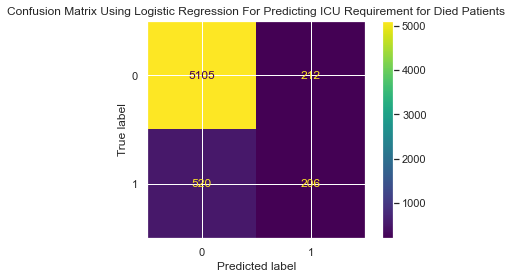

In [62]:
lr_best_model = LogisticRegression(penalty= 'l1' , C= 0.4 , solver= 'saga', l1_ratio= 0, random_state = 42)
lr_best_model.fit(X_train_D, y_train_D)
predictions_lr = lr_best_model.predict(X_test_D)
predictions_prob_lr = lr_best_model.predict_proba(X_test_D)[:, 1]
plot_confusion_matrix(lr_best_model, X_test_D, y_test_D)
plt.title('Confusion Matrix Using Logistic Regression For Predicting ICU Requirement for Died Patients')
print('Accuracy: ',accuracy_score(y_test_D, predictions_lr))

In [63]:
lr_features = pd.DataFrame({"Feature":X_train_D.columns.tolist(),"Coefficients":np.exp(lr_best_model.coef_[0])}).sort_values(by = 'Coefficients',ascending = False)
lr_features

,Feature,Coefficients
1,intubed,19.415629
2,pneumonia,2.411821
3,pregnancy,2.249683
15,Age_Category_2-10,1.528796
7,inmsupr,1.407642
22,Age_Category_Less than 2,1.194570
11,obesity,1.175979
4,diabetes,1.002346
6,asthma,1.000000
10,cardiovascular,1.000000


In [64]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_lr = accuracy_score(y_test_D, predictions_lr)
print("Accuracy : ", accuracy_score(y_test_D, predictions_lr))
precision_lr = precision_score(y_test_D, predictions_lr)
print("Precision : ", precision_score(y_test_D, predictions_lr))
recall_lr = recall_score(y_test_D, predictions_lr)
print("Recall : ", recall_score(y_test_D, predictions_lr))
f1_score_lr = f1_score(y_test_D, predictions_lr)
print("f-1 Score : ",f1_score(y_test_D, predictions_lr))

Accuracy :  0.8788681118649677
Precision :  0.49282296650717705
Recall :  0.2837465564738292
f-1 Score :  0.3601398601398601


In [65]:
from sklearn import metrics
print(metrics.classification_report(y_test_D, predictions_lr))

              precision    recall  f1-score   support

           0       0.91      0.96      0.93      5317
           1       0.49      0.28      0.36       726

    accuracy                           0.88      6043
   macro avg       0.70      0.62      0.65      6043
weighted avg       0.86      0.88      0.86      6043



In [66]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_D, predictions_prob_lr)
auc_score_lr = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_lr)

lr_precision, lr_recall, _ = precision_recall_curve(y_test_D, predictions_prob_lr)
lr_f, lr_score_PRC = f1_score(y_test_D, predictions_lr), auc(lr_recall, lr_precision)
print("AUC under PR Curve : ",lr_score_PRC)

AUC under ROC :  0.8337612968642085
AUC under PR Curve :  0.42368344011838704


In [67]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_D, predictions_prob_lr)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Logistic Regression For Predicting ICU Requirement for Died Patients',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

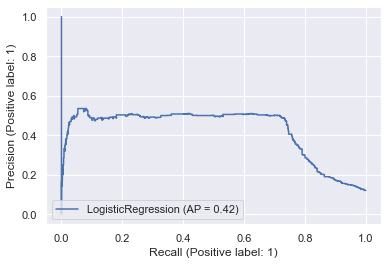

In [68]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(lr_best_model, X_test_D, y_test_D)


precision, recall, thresholds = precision_recall_curve(y_test_D, predictions_prob_lr)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Logistic Regression For Predicting ICU Requirement for Died Patients',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Decision Trees

In [69]:
%time dt_best_params, dt_best_score = hypertuning(dt, dt_params, n_iter = 4, X=X_train_D, y=y_train_D)

print(dt_best_params)
print(dt_best_score)

Tuning Hyperparameters.....
Wall time: 1.35 s
{'criterion': 'entropy', 'max_depth': 5, 'max_features': 'auto', 'splitter': 'best'}
0.8835650446871898


In [70]:
# Fitting the Model
dt_best_model = DecisionTreeClassifier(splitter= 'random' , max_features= 'auto' , max_depth= 10, criterion= 'entropy' , random_state = 42)
dt_best_model.fit(X_train_D, y_train_D)

DecisionTreeClassifier(criterion='entropy', max_depth=10, max_features='auto',
                       random_state=42, splitter='random')

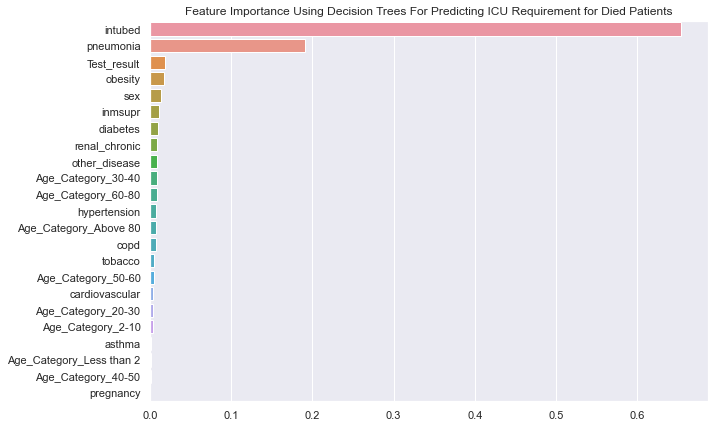

In [71]:
# get features importance
dt_feature_importance = pd.Series(dt_best_model.feature_importances_,index=X_train_D.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = dt_feature_importance, y = dt_feature_importance.index)

plt.title("Feature Importance Using Decision Trees For Predicting ICU Requirement for Died Patients")
plt.show()

Accuracy:  0.8724143637266258


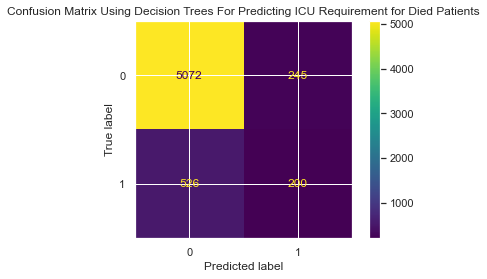

In [72]:
# Predicting the test set and finding the accuracy
predictions_dt = dt_best_model.predict(X_test_D)
predictions_prob_dt = dt_best_model.predict_proba(X_test_D)[:, 1]
plot_confusion_matrix(dt_best_model, X_test_D, y_test_D)
plt.title('Confusion Matrix Using Decision Trees For Predicting ICU Requirement for Died Patients')
print('Accuracy: ',accuracy_score(y_test_D, predictions_dt))

In [73]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuarcy_dt = accuracy_score(y_test_D, predictions_dt)
print("Accuracy : ", accuracy_score(y_test_D, predictions_dt))
precision_dt = precision_score(y_test_D, predictions_dt)
print("Precision : ", precision_score(y_test_D, predictions_dt))
recall_dt = recall_score(y_test_D, predictions_dt)
print("Recall : ", recall_score(y_test_D, predictions_dt))
f1_score_dt = f1_score(y_test_D, predictions_dt)                             
print("f-1 Score : ",f1_score(y_test_D, predictions_dt))

Accuracy :  0.8724143637266258
Precision :  0.449438202247191
Recall :  0.27548209366391185
f-1 Score :  0.3415883859948762


In [74]:
from sklearn import metrics
print(metrics.classification_report(y_test_D, predictions_dt))

              precision    recall  f1-score   support

           0       0.91      0.95      0.93      5317
           1       0.45      0.28      0.34       726

    accuracy                           0.87      6043
   macro avg       0.68      0.61      0.64      6043
weighted avg       0.85      0.87      0.86      6043



In [75]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_D, predictions_prob_dt)
auc_score_dt = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_dt)
dt_precision, dt_recall, _ = precision_recall_curve(y_test_D, predictions_prob_dt)
dt_f, dt_score_PRC = f1_score(y_test_D, predictions_dt), auc(dt_recall, dt_precision)
print("AUC under PR Curve : ",dt_score_PRC)

AUC under ROC :  0.7764588712021475
AUC under PR Curve :  0.35305505653161673


In [76]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_D, predictions_prob_dt)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Decision Trees For Predicting ICU Requirement for Died Patients',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

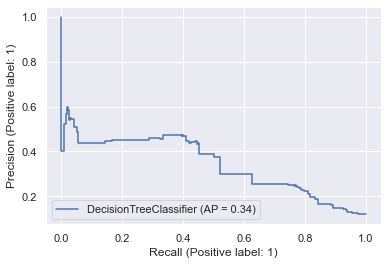

In [77]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(dt_best_model, X_test_D, y_test_D)


precision, recall, thresholds = precision_recall_curve(y_test_D, predictions_prob_dt)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Decision Trees for Predicting ICU Requirement for Died Patients',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Random Forest

In [78]:
%time rf_best_params, rf_best_score = hypertuning(rf, rf_params, n_iter = 4, X=X_train_D, y=y_train_D)

print(rf_best_params)
print(rf_best_score)

Tuning Hyperparameters.....
Wall time: 1min 30s
{'criterion': 'gini', 'max_depth': 12, 'max_features': 'auto', 'n_estimators': 125}
0.8817858325057927


In [79]:
# fitting the Model
rf_best_model = RandomForestClassifier(n_estimators= 80 , max_features= 'auto' , max_depth= 13, criterion= 'entropy' , random_state = 42)
rf_best_model.fit(X_train_D, y_train_D)

RandomForestClassifier(criterion='entropy', max_depth=13, n_estimators=80,
                       random_state=42)

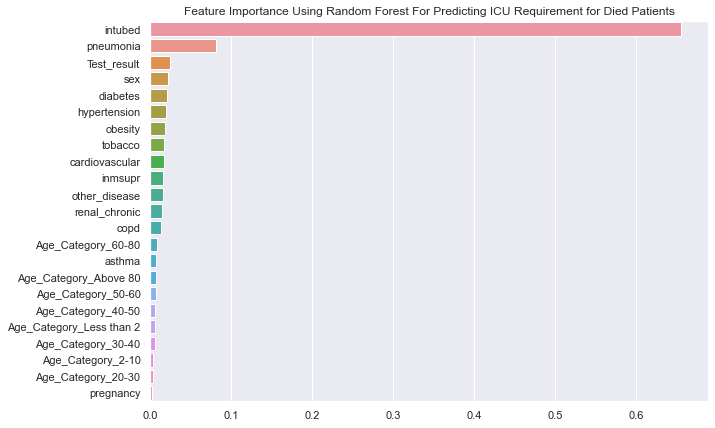

In [80]:
# get features importance
rf_feature_importance = pd.Series(rf_best_model.feature_importances_,index=X_train_D.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = rf_feature_importance, y = rf_feature_importance.index)

plt.title("Feature Importance Using Random Forest For Predicting ICU Requirement for Died Patients")
plt.show()

Accuracy:  0.8787026311434718


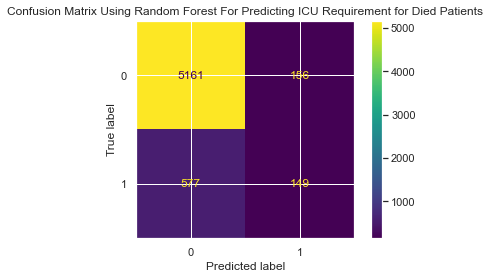

In [81]:
# Predicting the test set and calculationg the accuracy 
predictions_rf = rf_best_model.predict(X_test_D)
predictions_prob_rf = rf_best_model.predict_proba(X_test_D)[:, 1]
plot_confusion_matrix(rf_best_model, X_test_D, y_test_D)
plt.title('Confusion Matrix Using Random Forest For Predicting ICU Requirement for Died Patients')
print('Accuracy: ',accuracy_score(y_test_D, predictions_rf))

In [82]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_rf = accuracy_score(y_test_D, predictions_rf)
print("Accuracy : ", accuracy_score(y_test_D, predictions_rf))
precision_rf = precision_score(y_test_D, predictions_rf)
print("Precision : ", precision_score(y_test_D, predictions_rf))
recall_rf = recall_score(y_test_D, predictions_rf)
print("Recall : ", recall_score(y_test_D, predictions_rf))
f1_score_rf = f1_score(y_test_D, predictions_rf)
print("f-1 Score : ",f1_score(y_test_D, predictions_rf))

Accuracy :  0.8787026311434718
Precision :  0.4885245901639344
Recall :  0.20523415977961432
f-1 Score :  0.2890397672162948


In [83]:
from sklearn import metrics
print(metrics.classification_report(y_test_D, predictions_rf))

              precision    recall  f1-score   support

           0       0.90      0.97      0.93      5317
           1       0.49      0.21      0.29       726

    accuracy                           0.88      6043
   macro avg       0.69      0.59      0.61      6043
weighted avg       0.85      0.88      0.86      6043



In [84]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_D, predictions_prob_rf)
auc_score_rf = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_rf)
rf_precision, rf_recall, _ = precision_recall_curve(y_test_D, predictions_prob_rf)
rf_f, rf_score_PRC = f1_score(y_test_D, predictions_rf), auc(rf_recall, rf_precision)
print("AUC under PR Curve : ",rf_score_PRC)

AUC under ROC :  0.834285629906879
AUC under PR Curve :  0.41967981133815924


In [85]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_D, predictions_prob_rf)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Random Forest For Predicting ICU Requirement for Died Patients',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

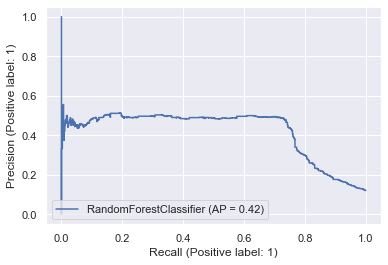

In [86]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(rf_best_model, X_test_D, y_test_D)


precision, recall, thresholds = precision_recall_curve(y_test_D, predictions_prob_rf)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Random Forest For Predicting ICU Requirement for Died Patients',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Gradient Boosting

In [87]:
%time gbt_best_params, gbt_best_score = hypertuning(gbt, gbt_params, n_iter = 4, X=X_train_D, y=y_train_D)

print(gbt_best_params)
print(gbt_best_score)

Tuning Hyperparameters.....
Wall time: 5min
{'criterion': 'friedman_mse', 'learning_rate': 0.05, 'loss': 'exponential', 'max_depth': 5, 'max_features': 'sqrt'}
0.8826133730552798


In [88]:
gbt_best_model = GradientBoostingClassifier( max_features= 'auto' , max_depth= 7, criterion= 'friedman_mse', loss ='deviance', learning_rate = 0.1, random_state = 42)
gbt_best_model.fit(X_train_D, y_train_D)

GradientBoostingClassifier(max_depth=7, max_features='auto', random_state=42)

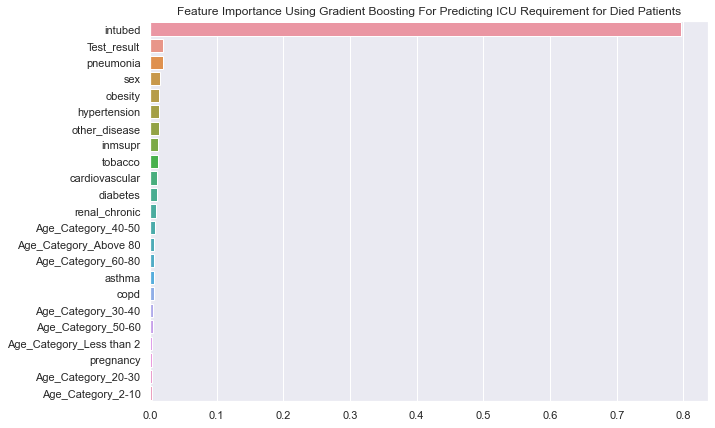

In [89]:
# get features importance
gbt_feature_importance = pd.Series(gbt_best_model.feature_importances_,index=X_train_D.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = gbt_feature_importance, y = gbt_feature_importance.index)

plt.title("Feature Importance Using Gradient Boosting For Predicting ICU Requirement for Died Patients")
plt.show()

Accuracy:  0.8808538805229191


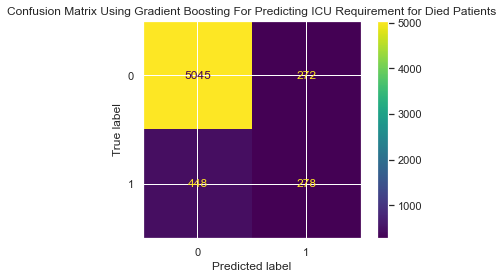

In [90]:
predictions_gbt = gbt_best_model.predict(X_test_D)
predictions_prob_gbt = gbt_best_model.predict_proba(X_test_D)[:, 1]
plot_confusion_matrix(gbt_best_model, X_test_D, y_test_D)
plt.title('Confusion Matrix Using Gradient Boosting For Predicting ICU Requirement for Died Patients')
print('Accuracy: ',accuracy_score(y_test_D, predictions_gbt))

In [91]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_gbt = accuracy_score(y_test_D, predictions_gbt)
print("Accuracy : ", accuracy_score(y_test_D, predictions_gbt))
precision_gbt = precision_score(y_test_D, predictions_gbt)
print("Precision : ", precision_score(y_test_D, predictions_gbt))
recall_gbt = recall_score(y_test_D, predictions_gbt)
print("Recall : ", recall_score(y_test_D, predictions_gbt))
f1_score_gbt = f1_score(y_test_D, predictions_gbt)
print("f-1 Score : ",f1_score(y_test_D, predictions_gbt))

Accuracy :  0.8808538805229191
Precision :  0.5054545454545455
Recall :  0.38292011019283745
f-1 Score :  0.4357366771159875


In [92]:
from sklearn import metrics
print(metrics.classification_report(y_test_D, predictions_gbt))

              precision    recall  f1-score   support

           0       0.92      0.95      0.93      5317
           1       0.51      0.38      0.44       726

    accuracy                           0.88      6043
   macro avg       0.71      0.67      0.68      6043
weighted avg       0.87      0.88      0.87      6043



In [93]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_D, predictions_prob_gbt)
auc_score_gbt = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_gbt)
gbt_precision, gbt_recall, _ = precision_recall_curve(y_test_D, predictions_prob_gbt)
gbt_f, gbt_score_PRC = f1_score(y_test_D, predictions_gbt), auc(gbt_recall, gbt_precision)
print("AUC under PR Curve : ",gbt_score_PRC)

AUC under ROC :  0.830732651804001
AUC under PR Curve :  0.4210717238588094


In [94]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_D, predictions_prob_gbt)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Gradient Boosting For Predicting ICU Requirement for Died Patients',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

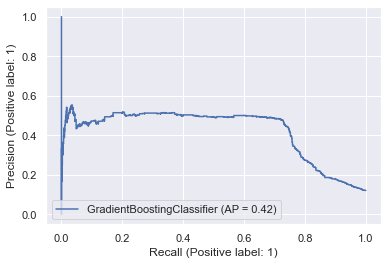

In [95]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(gbt_best_model, X_test_D, y_test_D)


precision, recall, thresholds = precision_recall_curve(y_test_D, predictions_prob_gbt)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Gradient Boosting For Predicting ICU Requirement for Died Patients',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

In [96]:
# initialize list of lists
data_icu = [['Logistic Regression', accuracy_lr, precision_lr, recall_lr, f1_score_lr, auc_score_gbt, gbt_score_PRC], \
              ['Decision Trees', accuarcy_dt, precision_dt, recall_dt, f1_score_dt, auc_score_dt, dt_score_PRC],\
              ['Random Forest', accuracy_rf,precision_rf, recall_rf, f1_score_rf, auc_score_rf, rf_score_PRC], \
              ['Gradient Boosting Trees', accuracy_gbt, precision_gbt, recall_gbt, f1_score_gbt, auc_score_gbt, gbt_score_PRC]]\
        
  
# Create the pandas DataFrame
icu_D_df = pd.DataFrame(data_icu, columns = ['Model', 'Accuracy', 'Precision',  'Recall', 'F1Score', 'AreaROC', 'AreaPRCurve'])
  
# print dataframe.
icu_D_df

,Model,Accuracy,Precision,Recall,F1Score,AreaROC,AreaPRCurve
0,Logistic Regression,0.878868,0.492823,0.283747,0.360140,0.830733,0.421072
1,Decision Trees,0.872414,0.449438,0.275482,0.341588,0.776459,0.353055
2,Random Forest,0.878703,0.488525,0.205234,0.289040,0.834286,0.419680
3,Gradient Boosting Trees,0.880854,0.505455,0.382920,0.435737,0.830733,0.421072


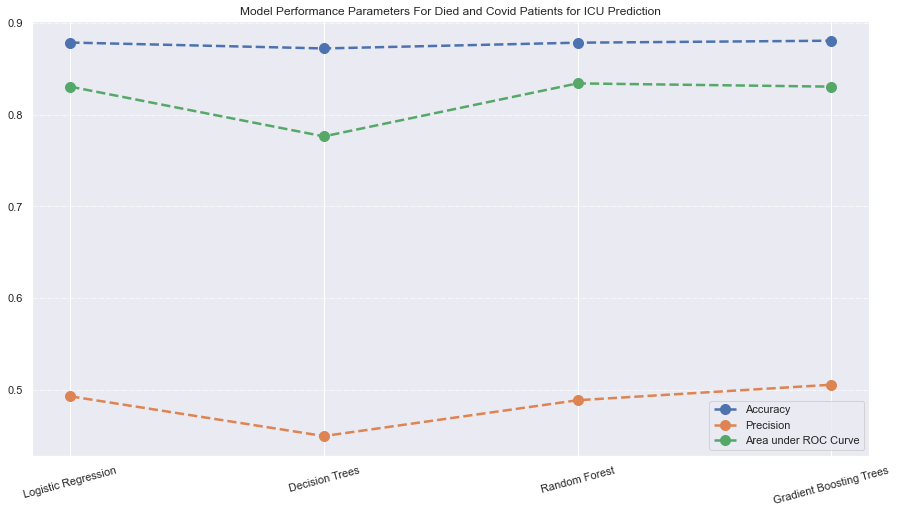

In [97]:
# plot lines
plt.figure(figsize=(15,8))
plt.plot(icu_D_df.Model, icu_D_df.Accuracy, label = "Accuracy", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(icu_D_df.Model, icu_D_df.Precision, label = "Precision", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
#plt.plot(icu_D_df.Model, icu_D_df.Recall, label = "Recall", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
#plt.plot(icu_D_df.Model, icu_D_df['F1Score'], label = "F1 Score", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.plot(icu_D_df.Model, icu_D_df.AreaROC, label = "Area under ROC Curve", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
#plt.plot(icu_D_df.Model, icu_D_df.AreaPRCurve, label = "Area under PR Curve", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.legend()
plt.xticks(rotation = 15) # Rotates X-Axis Ticks by 45-degrees
plt.grid(axis = 'y', linestyle='-.', linewidth=0.7)
plt.title('Model Performance Parameters For Died and Covid Patients for ICU Prediction')
plt.show()

## Predicting ICU Requirement for Hospitalized Patients

In [98]:
df_NoDeath = df.loc[df.death == 0].drop(['id','patient_type','death','entry_date','date_symptoms','Count','date_died'], axis = 'columns')
df_NoDeath.head()

,sex,intubed,pneumonia,pregnancy,diabetes,copd,asthma,inmsupr,hypertension,other_disease,cardiovascular,obesity,renal_chronic,tobacco,Test_result,icu,Age_Category
2,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,50-60
3,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,20-30
6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,60-80
9,1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,30-40
10,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,40-50


In [99]:
X = df_NoDeath.drop('icu', axis = 'columns')
y = df_NoDeath.icu

In [100]:
# One hot encoding age feature

X = pd.get_dummies(X, drop_first=True)

In [101]:
from sklearn.model_selection import train_test_split
X_train_ND, X_test_ND, y_train_ND, y_test_ND = train_test_split(X,y,test_size=0.2, random_state=42)  # X_test is a hold out test set. 
# Hold out test set should not be used in Hyperparameter tuning.

### Logistic Regression

In [102]:
%time lr_best_params, lr_best_score = hypertuning(log_reg, log_reg_params, n_iter = 4, X=X_train_ND, y=y_train_ND)

print(lr_best_params)
print(lr_best_score)

Tuning Hyperparameters.....
Wall time: 48.9 s
{'C': 0.4, 'l1_ratio': 0.02, 'penalty': 'elasticnet', 'solver': 'saga'}
0.9351463572764525


Accuracy:  0.9339273927392739


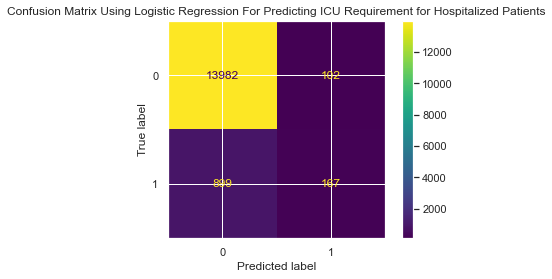

In [103]:
lr_best_model = LogisticRegression(penalty= 'elasticnet' , C= 0.4 , solver= 'saga', l1_ratio= 0.02, random_state = 42)
lr_best_model.fit(X_train_ND, y_train_ND)
predictions_lr = lr_best_model.predict(X_test_ND)
predictions_prob_lr = lr_best_model.predict_proba(X_test_ND)[:, 1]
plot_confusion_matrix(lr_best_model, X_test_ND, y_test_ND)
plt.title('Confusion Matrix Using Logistic Regression For Predicting ICU Requirement for Hospitalized Patients')
print('Accuracy: ',accuracy_score(y_test_ND, predictions_lr))

In [104]:
lr_features = pd.DataFrame({"Feature":X_train_ND.columns.tolist(),"Coefficients":np.exp(lr_best_model.coef_[0])}).sort_values(by = 'Coefficients',ascending = False)
lr_features

,Feature,Coefficients
1,intubed,16.079155
22,Age_Category_Less than 2,2.861726
2,pneumonia,2.086370
10,cardiovascular,1.374341
3,pregnancy,1.280289
11,obesity,1.225759
7,inmsupr,1.159803
9,other_disease,1.143461
4,diabetes,1.113267
6,asthma,1.074137


In [105]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_lr = accuracy_score(y_test_ND, predictions_lr)
print("Accuracy : ", accuracy_score(y_test_ND, predictions_lr))
precision_lr = precision_score(y_test_ND, predictions_lr)
print("Precision : ", precision_score(y_test_ND, predictions_lr))
recall_lr = recall_score(y_test_ND, predictions_lr)
print("Recall : ", recall_score(y_test_ND, predictions_lr))
f1_score_lr = f1_score(y_test_ND, predictions_lr)
print("f-1 Score : ",f1_score(y_test_ND, predictions_lr))

Accuracy :  0.9339273927392739
Precision :  0.620817843866171
Recall :  0.15666041275797374
f-1 Score :  0.25018726591760304


In [106]:
from sklearn import metrics
print(metrics.classification_report(y_test_ND, predictions_lr))

              precision    recall  f1-score   support

           0       0.94      0.99      0.97     14084
           1       0.62      0.16      0.25      1066

    accuracy                           0.93     15150
   macro avg       0.78      0.57      0.61     15150
weighted avg       0.92      0.93      0.92     15150



In [107]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_ND, predictions_prob_lr)
auc_score_lr = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_lr)
lr_precision, lr_recall, _ = precision_recall_curve(y_test_ND, predictions_prob_lr)
lr_f, lr_score_PRC = f1_score(y_test_ND, predictions_lr), auc(lr_recall, lr_precision)
print("AUC under PR Curve : ",lr_score_PRC)

AUC under ROC :  0.755402621792696
AUC under PR Curve :  0.3336459957763601


In [108]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_ND, predictions_prob_lr)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Logistic Regression For Predicting ICU Requirement for Hospitalized Patients',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

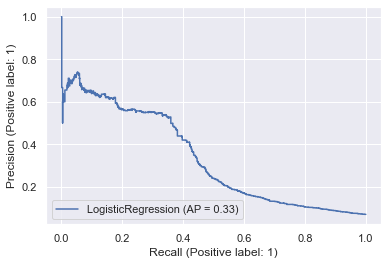

In [109]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(lr_best_model, X_test_ND, y_test_ND)


precision, recall, thresholds = precision_recall_curve(y_test_ND, predictions_prob_lr)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Logistic Regression For Predicting ICU Requirement for Hospitalized Patients',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Decision Trees

In [110]:
%time dt_best_params, dt_best_score = hypertuning(dt, dt_params, n_iter = 4, X=X_train_ND, y=y_train_ND)

print(dt_best_params)
print(dt_best_score)

Tuning Hyperparameters.....
Wall time: 3.36 s
{'criterion': 'entropy', 'max_depth': 6, 'max_features': 'auto', 'splitter': 'best'}
0.9349648383076835


In [111]:
# Fitting the Model
dt_best_model = DecisionTreeClassifier(splitter= 'best' , max_features= 'auto' , max_depth= 7, criterion= 'gini' , random_state = 42)
dt_best_model.fit(X_train_ND, y_train_ND)

DecisionTreeClassifier(max_depth=7, max_features='auto', random_state=42)

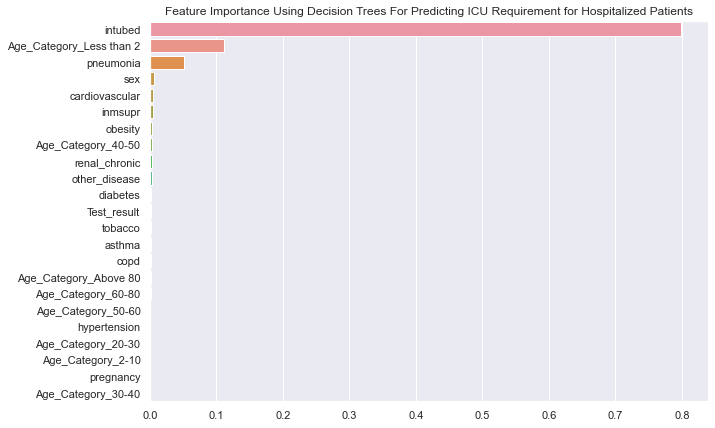

In [112]:
# get features importance
dt_feature_importance = pd.Series(dt_best_model.feature_importances_,index=X_train_ND.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = dt_feature_importance, y = dt_feature_importance.index)

plt.title("Feature Importance Using Decision Trees For Predicting ICU Requirement for Hospitalized Patients")
plt.show()

Accuracy:  0.9324092409240924


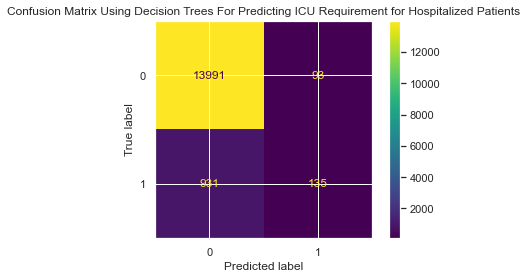

In [113]:
# Predicting the test set and finding the accuracy
predictions_dt = dt_best_model.predict(X_test_ND)
predictions_prob_dt = dt_best_model.predict_proba(X_test_ND)[:, 1]
plot_confusion_matrix(dt_best_model, X_test_ND, y_test_ND)
plt.title('Confusion Matrix Using Decision Trees For Predicting ICU Requirement for Hospitalized Patients')
print('Accuracy: ',accuracy_score(y_test_ND, predictions_dt))

In [114]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_dt = accuracy_score(y_test_ND, predictions_dt)
print("Accuracy : ", accuracy_score(y_test_ND, predictions_dt))
precision_dt = precision_score(y_test_ND, predictions_dt)
print("Precision : ", precision_score(y_test_ND, predictions_dt))
recall_dt = recall_score(y_test_ND, predictions_dt)
print("Recall : ", recall_score(y_test_ND, predictions_dt))
f1_score_dt = f1_score(y_test_ND, predictions_dt)
print("f-1 Score : ",f1_score(y_test_ND, predictions_dt))

Accuracy :  0.9324092409240924
Precision :  0.5921052631578947
Recall :  0.12664165103189493
f-1 Score :  0.2086553323029366


In [115]:
from sklearn import metrics
print(metrics.classification_report(y_test_ND, predictions_dt))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96     14084
           1       0.59      0.13      0.21      1066

    accuracy                           0.93     15150
   macro avg       0.76      0.56      0.59     15150
weighted avg       0.91      0.93      0.91     15150



In [116]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_ND, predictions_prob_dt)
auc_score_dt = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_dt)
dt_precision, dt_recall, _ = precision_recall_curve(y_test_ND, predictions_prob_dt)
dt_f, dt_score_PRC = f1_score(y_test_ND, predictions_dt), auc(dt_recall, dt_precision)
print("AUC under PR Curve : ",dt_score_PRC)

AUC under ROC :  0.7302459699055733
AUC under PR Curve :  0.2984302150607695


In [117]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_ND, predictions_prob_dt)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Decision Trees For Predicting ICU Requirement for Hospitalized Patients',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

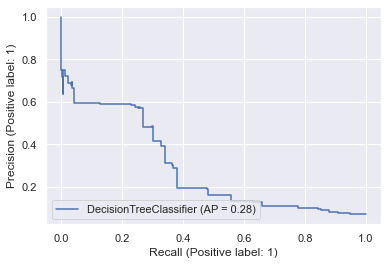

In [118]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(dt_best_model, X_test_ND, y_test_ND)


precision, recall, thresholds = precision_recall_curve(y_test_ND, predictions_prob_dt)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Decision Trees For Predicting ICU Requirement for Hospitalized Patients',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Random Forest

In [119]:
%time rf_best_params, rf_best_score = hypertuning(rf, rf_params, n_iter = 4, X=X_train_ND, y=y_train_ND)

print(rf_best_params)
print(rf_best_score)

Tuning Hyperparameters.....
Wall time: 5min 2s
{'criterion': 'entropy', 'max_depth': 10, 'max_features': 'auto', 'n_estimators': 100}
0.9347668119700727


In [120]:
# fitting the Model
rf_best_model = RandomForestClassifier(n_estimators= 200 , max_features= 'auto' , max_depth= 12, criterion= 'entropy' , random_state = 42)
rf_best_model.fit(X_train_ND, y_train_ND)

RandomForestClassifier(criterion='entropy', max_depth=12, n_estimators=200,
                       random_state=42)

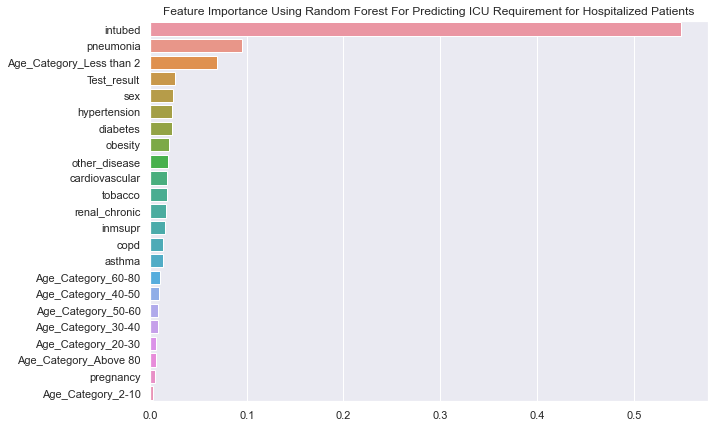

In [121]:
# get features importance
rf_feature_importance = pd.Series(rf_best_model.feature_importances_,index=X_train_ND.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = rf_feature_importance, y = rf_feature_importance.index)

plt.title("Feature Importance Using Random Forest For Predicting ICU Requirement for Hospitalized Patients")
plt.show()

Accuracy:  0.9326072607260726


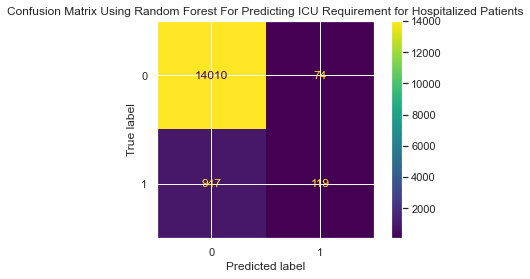

In [122]:
# Predicting the test set and calculationg the accuracy 
predictions_rf = rf_best_model.predict(X_test_ND)
predictions_prob_rf = rf_best_model.predict_proba(X_test_ND)[:, 1]
plot_confusion_matrix(rf_best_model, X_test_ND, y_test_ND)
plt.title('Confusion Matrix Using Random Forest For Predicting ICU Requirement for Hospitalized Patients')
print('Accuracy: ',accuracy_score(y_test_ND, predictions_rf))

In [123]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_rf = accuracy_score(y_test_ND, predictions_rf)
print("Accuracy : ", accuracy_score(y_test_ND, predictions_rf))
precision_rf =  precision_score(y_test_ND, predictions_rf)
print("Precision : ", precision_score(y_test_ND, predictions_rf))
recall_rf = recall_score(y_test_ND, predictions_rf)
print("Recall : ", recall_score(y_test_ND, predictions_rf))
f1_score_rf = f1_score(y_test_ND, predictions_rf)
print("f-1 Score : ",f1_score(y_test_ND, predictions_rf))

Accuracy :  0.9326072607260726
Precision :  0.616580310880829
Recall :  0.11163227016885553
f-1 Score :  0.18903891977760126


In [124]:
from sklearn import metrics
print(metrics.classification_report(y_test_ND, predictions_rf))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96     14084
           1       0.62      0.11      0.19      1066

    accuracy                           0.93     15150
   macro avg       0.78      0.55      0.58     15150
weighted avg       0.91      0.93      0.91     15150



In [125]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_ND, predictions_prob_rf)
auc_score_rf = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_rf)
rf_precision, rf_recall, _ = precision_recall_curve(y_test_ND, predictions_prob_rf)
rf_f, rf_score_PRC = f1_score(y_test_ND, predictions_rf), auc(rf_recall, rf_precision)
print("AUC under PR Curve : ",rf_score_PRC)

AUC under ROC :  0.7519601301331651
AUC under PR Curve :  0.3248373168337619


In [126]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_ND, predictions_prob_rf)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Random Forest For Predicting ICU Requirement for Hospitalized Patients',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

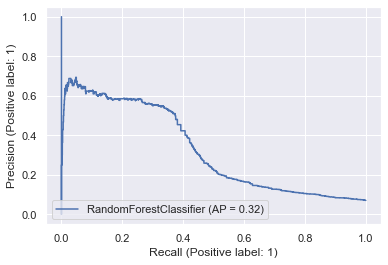

In [127]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(rf_best_model, X_test_ND, y_test_ND)


precision, recall, thresholds = precision_recall_curve(y_test_ND, predictions_prob_rf)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Random Forest For Predicting ICU Requirement for Hospitalized Patients',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Gradient Boosting

In [128]:
%time gbt_best_params, gbt_best_score = hypertuning(gbt, gbt_params, n_iter = 4, X=X_train_ND, y=y_train_ND)

print(gbt_best_params)
print(gbt_best_score)

Tuning Hyperparameters.....
Wall time: 12min 49s
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'exponential', 'max_depth': 6, 'max_features': 'sqrt'}
0.9351628458553564


In [129]:
gbt_best_model = GradientBoostingClassifier( max_features= 'sqrt' , max_depth= 10, criterion= 'friedman_mse', loss ='exponential', learning_rate = 0.1, random_state = 42)
gbt_best_model.fit(X_train_ND, y_train_ND)

GradientBoostingClassifier(loss='exponential', max_depth=10,
                           max_features='sqrt', random_state=42)

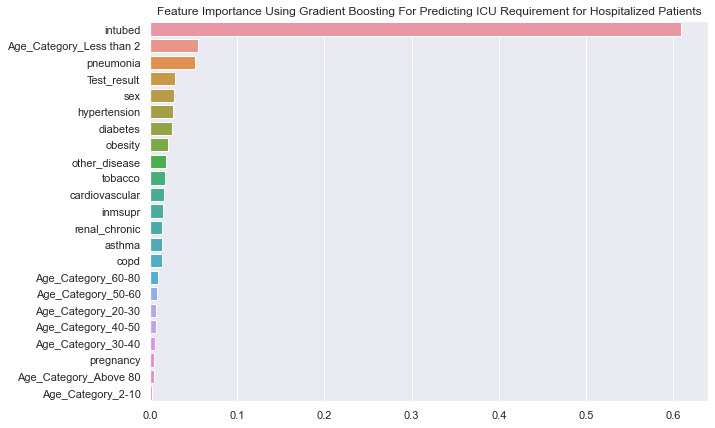

In [130]:
# get features importance
gbt_feature_importance = pd.Series(gbt_best_model.feature_importances_,index=X_train_ND.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = gbt_feature_importance, y = gbt_feature_importance.index)

plt.title("Feature Importance Using Gradient Boosting For Predicting ICU Requirement for Hospitalized Patients")
plt.show()

Accuracy: 0.9332673267326733


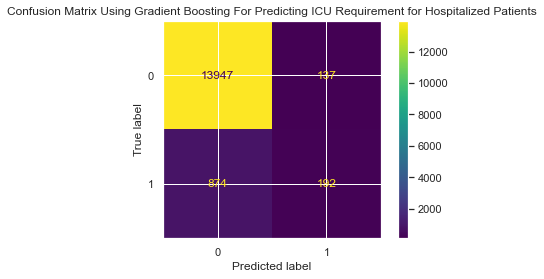

In [131]:
predictions_gbt = gbt_best_model.predict(X_test_ND)
predictions_prob_gbt = gbt_best_model.predict_proba(X_test_ND)[:, 1]
plot_confusion_matrix(gbt_best_model, X_test_ND, y_test_ND)
plt.title('Confusion Matrix Using Gradient Boosting For Predicting ICU Requirement for Hospitalized Patients')
print('Accuracy:',accuracy_score(y_test_ND, predictions_gbt))

In [132]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_gbt = accuracy_score(y_test_ND, predictions_gbt)
print("Accuracy : ", accuracy_score(y_test_ND, predictions_gbt))
precision_gbt = precision_score(y_test_ND, predictions_gbt)
print("Precision : ", precision_score(y_test_ND, predictions_gbt))
recall_gbt = recall_score(y_test_ND, predictions_gbt)
print("Recall : ", recall_score(y_test_ND, predictions_gbt))
f1_score_gbt = f1_score(y_test_ND, predictions_gbt)
print("f-1 Score : ",f1_score(y_test_ND, predictions_gbt))

Accuracy :  0.9332673267326733
Precision :  0.5835866261398176
Recall :  0.1801125703564728
f-1 Score :  0.2752688172043011


In [133]:
from sklearn import metrics
print(metrics.classification_report(y_test_ND, predictions_gbt))

              precision    recall  f1-score   support

           0       0.94      0.99      0.97     14084
           1       0.58      0.18      0.28      1066

    accuracy                           0.93     15150
   macro avg       0.76      0.59      0.62     15150
weighted avg       0.92      0.93      0.92     15150



In [134]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_ND, predictions_prob_gbt)
auc_score_gbt = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_gbt)
gbt_precision, gbt_recall, _ = precision_recall_curve(y_test_ND, predictions_prob_gbt)
gbt_f1, gbt_score_PRC = f1_score(y_test_ND, predictions_gbt), auc(gbt_recall, gbt_precision)
print("AUC under PR Curve : ",gbt_score_PRC)

AUC under ROC :  0.7096111684223259
AUC under PR Curve :  0.29093962964073544


In [135]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_ND, predictions_prob_gbt)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Gradient Boosting For Predicting ICU Requirement for Hospitalized Patients',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

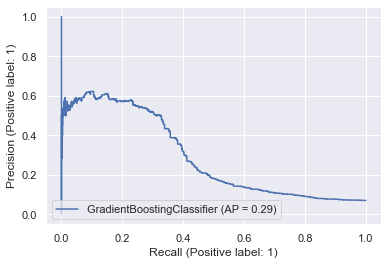

In [136]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(gbt_best_model, X_test_ND, y_test_ND)


precision, recall, thresholds = precision_recall_curve(y_test_ND, predictions_prob_gbt)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Gradient Boosting For Predicting ICU Requirement for Hospitalized Patients',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

In [137]:
# initialize list of lists
data_icu = [['Logistic Regression', accuracy_lr,precision_lr, recall_lr, f1_score_lr, auc_score_gbt, gbt_score_PRC], \
              ['Decision Trees', accuracy_dt,precision_dt, recall_dt, f1_score_dt, auc_score_dt, dt_score_PRC],\
              ['Random Forest', accuracy_rf,precision_rf, recall_rf, f1_score_rf, auc_score_rf, rf_score_PRC], \
              ['Gradient Boosting Trees', accuracy_gbt,precision_gbt, recall_gbt, f1_score_gbt, auc_score_gbt, gbt_score_PRC]]\
        
  
# Create the pandas DataFrame
icu_ND_df = pd.DataFrame(data_icu, columns = ['Model', 'Accuracy','Precision',  'Recall', 'F1Score', 'AreaROC', 'AreaPRCurve'])
  
# print dataframe.
icu_ND_df

,Model,Accuracy,Precision,Recall,F1Score,AreaROC,AreaPRCurve
0,Logistic Regression,0.933927,0.620818,0.156660,0.250187,0.709611,0.290940
1,Decision Trees,0.932409,0.592105,0.126642,0.208655,0.730246,0.298430
2,Random Forest,0.932607,0.616580,0.111632,0.189039,0.751960,0.324837
3,Gradient Boosting Trees,0.933267,0.583587,0.180113,0.275269,0.709611,0.290940


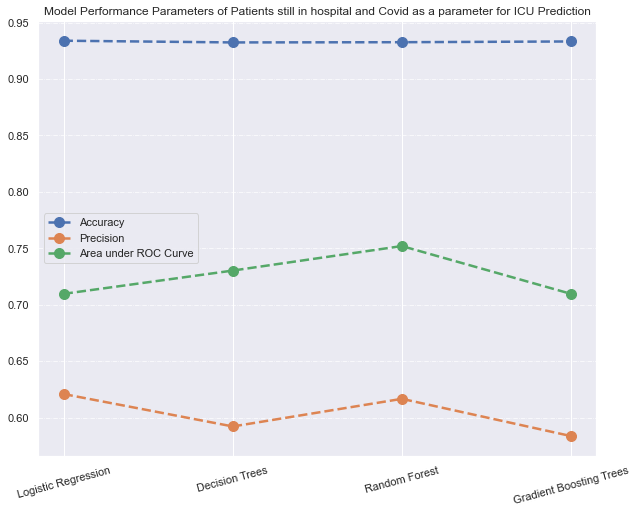

In [138]:
# plot lines
plt.figure(figsize=(10,8))
plt.plot(icu_ND_df.Model, icu_ND_df.Accuracy, label = "Accuracy", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(icu_ND_df.Model, icu_ND_df.Precision, label = "Precision", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
#plt.plot(icu_ND_df.Model, icu_ND_df.Recall, label = "Recall", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
#plt.plot(icu_ND_df.Model, icu_ND_df['F1Score'], label = "F1 Score", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.plot(icu_ND_df.Model, icu_ND_df.AreaROC, label = "Area under ROC Curve", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
#plt.plot(icu_ND_df.Model, icu_ND_df.AreaPRCurve, label = "Area under PR Curve", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.legend()
plt.xticks(rotation = 15) # Rotates X-Axis Ticks by 45-degrees
plt.grid(axis = 'y', linestyle='-.', linewidth=0.7)
plt.title('Model Performance Parameters of Patients still in hospital and Covid as a parameter for ICU Prediction')
plt.show()

# Predicting a Chance of Death for Patients Which Require ICU

In [139]:
df_icu = df.loc[df['icu'] == 1]
df_no_icu = df.loc[df['icu'] == 0]

## Patients Requiring ICU

In [140]:
X = df_icu.drop(['id','patient_type','pneumonia','intubed','entry_date','date_symptoms','date_died','Count',
                 'icu','death'], axis = 'columns')
y = df_icu.death

In [141]:
# One hot encoding age feature

X = pd.get_dummies(X, drop_first=True)

In [142]:
from sklearn.model_selection import train_test_split
X_train_I, X_test_I, y_train_I, y_test_I = train_test_split(X,y,test_size=0.2, random_state=42)  # X_test is a hold out test set. 
# Hold out test set should not be used in Hyperparameter tuning.

### Random Forest

In [143]:
%time rf_best_params, rf_best_score = hypertuning(rf, rf_params, n_iter = 4, X=X_train_I, y=y_train_I)

print(rf_best_params)
print(rf_best_score)

Tuning Hyperparameters.....
Wall time: 34.6 s
{'criterion': 'gini', 'max_depth': 8, 'max_features': 'auto', 'n_estimators': 175}
0.6552609067579127


In [144]:
rf_best_model = RandomForestClassifier(n_estimators= 200 , max_features= 'auto' , max_depth= 11, criterion= 'gini' , random_state = 42)
rf_best_model.fit(X_train_I, y_train_I)

RandomForestClassifier(max_depth=11, n_estimators=200, random_state=42)

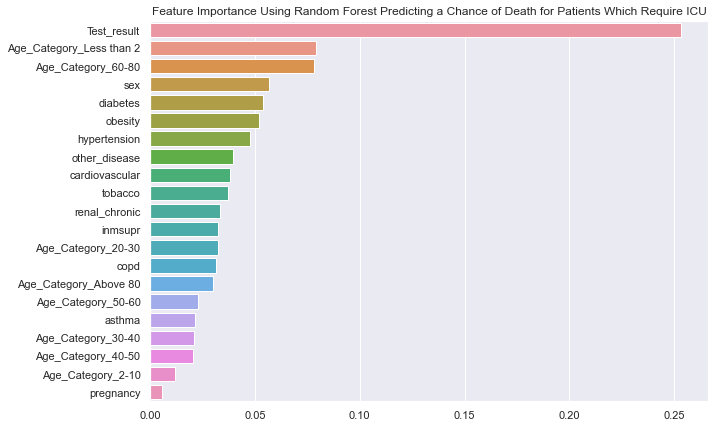

In [145]:
# get features importance
rf_feature_importance = pd.Series(rf_best_model.feature_importances_,index=X_train_I.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = rf_feature_importance, y = rf_feature_importance.index)

plt.title("Feature Importance Using Random Forest Predicting a Chance of Death for Patients Which Require ICU")
plt.show()

Accuracy:  0.6636259977194983


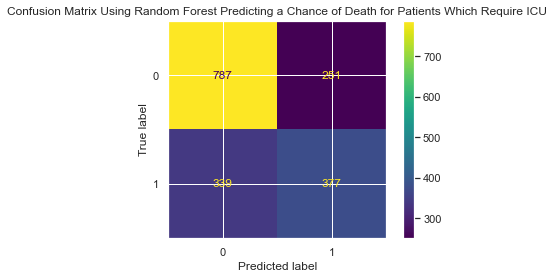

In [146]:
predictions_rf = rf_best_model.predict(X_test_I)
predictions_prob_rf = rf_best_model.predict_proba(X_test_I)[:, 1]
plot_confusion_matrix(rf_best_model, X_test_I, y_test_I)
plt.title('Confusion Matrix Using Random Forest Predicting a Chance of Death for Patients Which Require ICU')
print('Accuracy: ',accuracy_score(y_test_I, predictions_rf))

In [147]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy_rf = accuracy_score(y_test_I, predictions_rf)
print("Accuracy : ", accuracy_rf)
precision_rf = precision_score(y_test_I, predictions_rf)
print("Precision : ", precision_rf)
recall_rf = recall_score(y_test_I, predictions_rf)
print("Recall : ", recall_rf)
f1_score_rf = f1_score(y_test_I, predictions_rf)
print("f-1 Score : ",f1_score_rf)

Accuracy :  0.6636259977194983
Precision :  0.6003184713375797
Recall :  0.526536312849162
f-1 Score :  0.5610119047619049


In [148]:
from sklearn import metrics
print(metrics.classification_report(y_test_I, predictions_rf))

              precision    recall  f1-score   support

           0       0.70      0.76      0.73      1038
           1       0.60      0.53      0.56       716

    accuracy                           0.66      1754
   macro avg       0.65      0.64      0.64      1754
weighted avg       0.66      0.66      0.66      1754



In [149]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_I, predictions_prob_rf)
auc_score_rf = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_rf)
rf_precision, rf_recall, _ = precision_recall_curve(y_test_I, predictions_prob_rf)
rf_f1, rf_score_PRC = f1_score(y_test_I, predictions_rf), auc(rf_recall, rf_precision)
print("AUC under PR Curve : ",rf_score_PRC)

AUC under ROC :  0.7082559660283527
AUC under PR Curve :  0.5824936843045829


In [150]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_I, predictions_prob_rf)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Random Forest Predicting a Chance of Death for Patients Which Require ICU',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

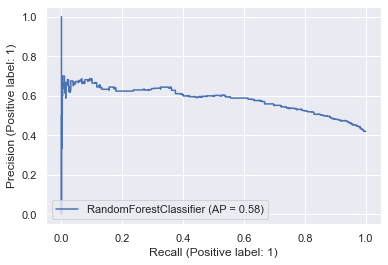

In [151]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(rf_best_model, X_test_I, y_test_I)


precision, recall, thresholds = precision_recall_curve(y_test_I, predictions_prob_rf)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Random Forest Predicting a Chance of Death for Patients Which Require ICU',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Gradient Boosting

In [152]:
%time gbt_best_params, gbt_best_score = hypertuning(gbt, gbt_params, n_iter = 4, X=X_train_I, y=y_train_I)

print(gbt_best_params)
print(gbt_best_score)

Tuning Hyperparameters.....
Wall time: 1min 56s
{'criterion': 'friedman_mse', 'learning_rate': 0.05, 'loss': 'exponential', 'max_depth': 5, 'max_features': 'sqrt'}
0.6516966067864272


In [153]:
gbt_best_model = GradientBoostingClassifier( max_features= 'auto' , max_depth= 8, criterion= 'friedman_mse', loss ='deviance', learning_rate = 0.05, random_state = 42)
gbt_best_model.fit(X_train_I, y_train_I)

GradientBoostingClassifier(learning_rate=0.05, max_depth=8, max_features='auto',
                           random_state=42)

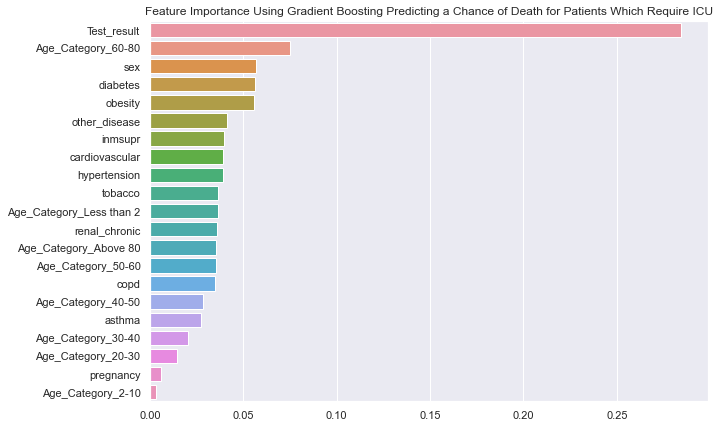

In [154]:
# get features importance
gbt_feature_importance = pd.Series(gbt_best_model.feature_importances_,index=X_train_I.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = gbt_feature_importance, y = gbt_feature_importance.index)

plt.title("Feature Importance Using Gradient Boosting Predicting a Chance of Death for Patients Which Require ICU")
plt.show()

Accuracy:  0.6630558722919042


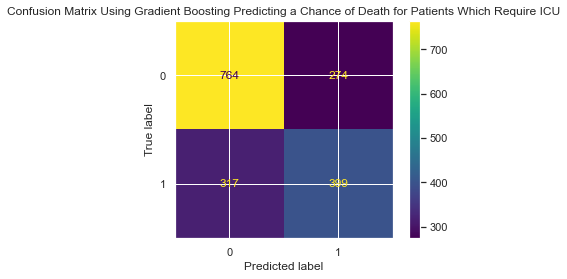

In [155]:
predictions_gbt = gbt_best_model.predict(X_test_I)
predictions_prob_gbt = gbt_best_model.predict_proba(X_test_I)[:, 1]
plot_confusion_matrix(gbt_best_model, X_test_I, y_test_I)
plt.title('Confusion Matrix Using Gradient Boosting Predicting a Chance of Death for Patients Which Require ICU')
print('Accuracy: ',accuracy_score(y_test_I, predictions_gbt))

In [156]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_gbt = accuracy_score(y_test_I, predictions_gbt)
print("Accuracy : ", accuracy_gbt)
precision_gbt = precision_score(y_test_I, predictions_gbt)
print("Precision : ", precision_gbt)
recall_gbt = recall_score(y_test_I, predictions_gbt)
print("Recall : ", recall_gbt)
f1_score_gbt = f1_score(y_test_I, predictions_gbt)
print("f-1 Score : ",f1_score_gbt)

Accuracy :  0.6630558722919042
Precision :  0.5928677563150074
Recall :  0.5572625698324022
f-1 Score :  0.5745140388768898


In [157]:
from sklearn import metrics
print(metrics.classification_report(y_test_I, predictions_gbt))

              precision    recall  f1-score   support

           0       0.71      0.74      0.72      1038
           1       0.59      0.56      0.57       716

    accuracy                           0.66      1754
   macro avg       0.65      0.65      0.65      1754
weighted avg       0.66      0.66      0.66      1754



In [158]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_I, predictions_prob_gbt)
auc_score_gbt = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_gbt)
gbt_precision, gbt_recall, _ = precision_recall_curve(y_test_I, predictions_prob_gbt)
gbt_f1, gbt_score_PRC = f1_score(y_test_I, predictions_gbt), auc(gbt_recall, gbt_precision)
print("AUC under PR Curve : ",gbt_score_PRC)

AUC under ROC :  0.7074150170611726
AUC under PR Curve :  0.5824480968006607


In [159]:
# ROC Curve

import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_I, predictions_prob_gbt)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Gradient Boosting Predicting a Chance of Death for Patients Which Require ICU',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

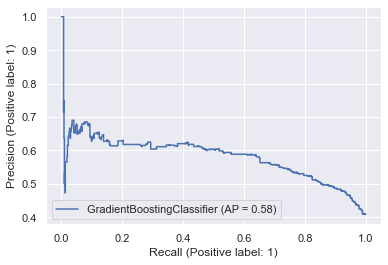

In [160]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(gbt_best_model, X_test_I, y_test_I)


precision, recall, thresholds = precision_recall_curve(y_test_I, predictions_prob_gbt)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Gradient Boosting Predicting a Chance of Death for Patients Which Require ICU',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

## Combining results into DF

In [161]:
# initialize list of lists
data_death = [['Random Forest', accuracy_rf,precision_rf, recall_rf, f1_score_rf, auc_score_rf, rf_score_PRC], \
              ['Gradient Boosting Trees', accuracy_gbt,precision_gbt, recall_gbt, f1_score_gbt, auc_score_gbt, gbt_score_PRC]]\
        
  
# Create the pandas DataFrame
death_df = pd.DataFrame(data_death, columns = ['Model', 'Accuracy', 'Precision',  'Recall', 'F1Score', 'AreaROC', 'AreaPRCurve'])
  
# print dataframe.
death_df

,Model,Accuracy,Precision,Recall,F1Score,AreaROC,AreaPRCurve
0,Random Forest,0.663626,0.600318,0.526536,0.561012,0.708256,0.582494
1,Gradient Boosting Trees,0.663056,0.592868,0.557263,0.574514,0.707415,0.582448


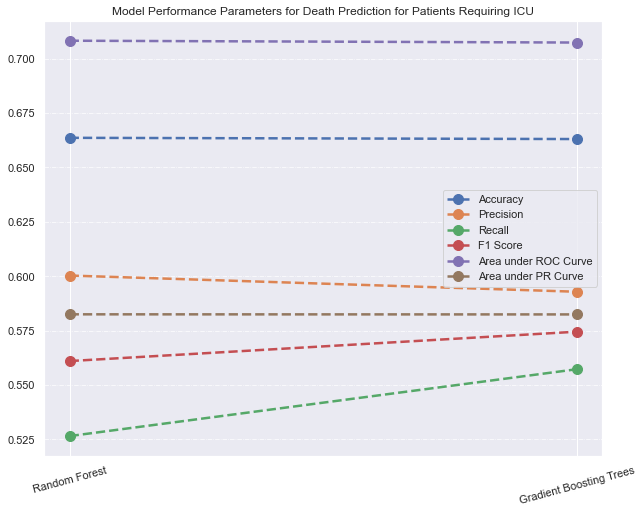

In [162]:
# plot lines
plt.figure(figsize=(10,8))
plt.plot(death_df.Model, death_df.Accuracy, label = "Accuracy", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(death_df.Model, death_df.Precision, label = "Precision", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(death_df.Model, death_df.Recall, label = "Recall", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(death_df.Model, death_df['F1Score'], label = "F1 Score", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.plot(death_df.Model, death_df.AreaROC, label = "Area under ROC Curve", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.plot(death_df.Model, death_df.AreaPRCurve, label = "Area under PR Curve", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.legend()
plt.xticks(rotation = 15) # Rotates X-Axis Ticks by 45-degrees
plt.grid(axis = 'y', linestyle='-.', linewidth=0.7)
plt.title('Model Performance Parameters for Death Prediction for Patients Requiring ICU')
plt.show()

# Predicting a Chance of Death for Patients Which don't Require ICU

## Patients Not Requiring ICU

In [163]:
X = df_no_icu.drop(['id','patient_type','pneumonia','intubed','entry_date','date_symptoms','date_died','Count',
                 'icu','death'], axis = 'columns')
y = df_no_icu.death

In [164]:
# One hot encoding age feature

X = pd.get_dummies(X, drop_first=True)

In [165]:
from sklearn.model_selection import train_test_split
X_train_NI, X_test_NI, y_train_NI, y_test_NI = train_test_split(X,y,test_size=0.2, random_state=42)  # X_test is a hold out test set. 
# Hold out test set should not be used in Hyperparameter tuning.

### Random Forest

In [166]:
%time rf_best_params, rf_best_score = hypertuning(rf, rf_params, n_iter = 4, X=X_train_NI, y=y_train_NI)

print(rf_best_params)
print(rf_best_score)

Tuning Hyperparameters.....
Wall time: 7min 34s
{'criterion': 'gini', 'max_depth': 10, 'max_features': 'auto', 'n_estimators': 200}
0.7304249448836925


In [167]:
rf_best_model = RandomForestClassifier(n_estimators= 125 , max_features= 'auto' , max_depth= 10, criterion= 'entropy' , random_state = 42)
rf_best_model.fit(X_train_NI, y_train_NI)

RandomForestClassifier(criterion='entropy', max_depth=10, n_estimators=125,
                       random_state=42)

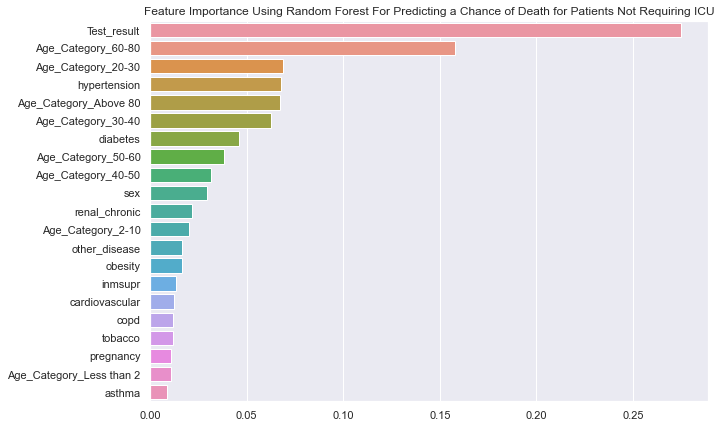

In [168]:
# get features importance
rf_feature_importance = pd.Series(rf_best_model.feature_importances_,index=X_train_NI.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = rf_feature_importance, y = rf_feature_importance.index)

plt.title("Feature Importance Using Random Forest For Predicting a Chance of Death for Patients Not Requiring ICU")
plt.show()

Accuracy:  0.7306445804825351


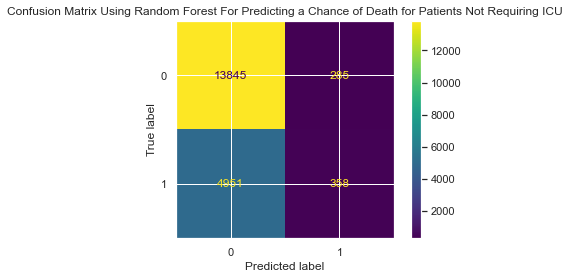

In [169]:
predictions_rf = rf_best_model.predict(X_test_NI)
predictions_prob_rf = rf_best_model.predict_proba(X_test_NI)[:, 1]
plot_confusion_matrix(rf_best_model, X_test_NI, y_test_NI)
plt.title('Confusion Matrix Using Random Forest For Predicting a Chance of Death for Patients Not Requiring ICU')
print('Accuracy: ',accuracy_score(y_test_NI, predictions_rf))

In [170]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy_rf = accuracy_score(y_test_NI, predictions_rf)
print("Accuracy : ", accuracy_rf)
precision_rf = precision_score(y_test_NI, predictions_rf)
print("Precision : ", precision_rf)
recall_rf = recall_score(y_test_NI, predictions_rf)
print("Recall : ", recall_rf)
f1_score_rf = f1_score(y_test_NI, predictions_rf)
print("f-1 Score : ",f1_score_rf)

Accuracy :  0.7306445804825351
Precision :  0.5567651632970451
Recall :  0.06743266151817669
f-1 Score :  0.12029569892473119


In [171]:
from sklearn import metrics
print(metrics.classification_report(y_test_NI, predictions_rf))

              precision    recall  f1-score   support

           0       0.74      0.98      0.84     14130
           1       0.56      0.07      0.12      5309

    accuracy                           0.73     19439
   macro avg       0.65      0.52      0.48     19439
weighted avg       0.69      0.73      0.64     19439



In [172]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_NI, predictions_prob_rf)
auc_score_rf = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_rf)
rf_precision, rf_recall, _ = precision_recall_curve(y_test_NI, predictions_prob_rf)
rf_f1, rf_score_PRC = f1_score(y_test_NI, predictions_rf), auc(rf_recall, rf_precision)
print("AUC under PR Curve : ",rf_score_PRC)

AUC under ROC :  0.7133133563070468
AUC under PR Curve :  0.45148002399529574


In [173]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_NI, predictions_prob_rf)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Random Forest For Predicting a Chance of Death for Patients Not Requiring ICU',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

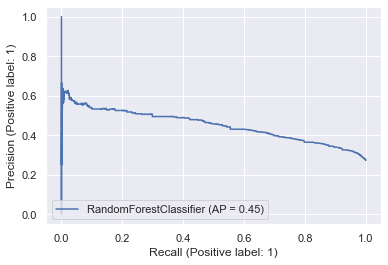

In [174]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(rf_best_model, X_test_NI, y_test_NI)


precision, recall, thresholds = precision_recall_curve(y_test_NI, predictions_prob_rf)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Random Forest For Predicting a Chance of Death for Patients Not Requiring ICU',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Gradient Boosting

In [175]:
%time gbt_best_params, gbt_best_score = hypertuning(gbt, gbt_params, n_iter = 4, X=X_train_NI, y=y_train_NI)

print(gbt_best_params)
print(gbt_best_score)

Tuning Hyperparameters.....
Wall time: 16min 41s
{'criterion': 'friedman_mse', 'learning_rate': 0.05, 'loss': 'deviance', 'max_depth': 5, 'max_features': 'auto'}
0.7320969421549156


In [176]:
gbt_best_model = GradientBoostingClassifier( max_features= 'sqrt' , max_depth= 12, criterion= 'friedman_mse', loss ='exponential', learning_rate = 0.05, random_state = 42)
gbt_best_model.fit(X_train_NI, y_train_NI)

GradientBoostingClassifier(learning_rate=0.05, loss='exponential', max_depth=12,
                           max_features='sqrt', random_state=42)

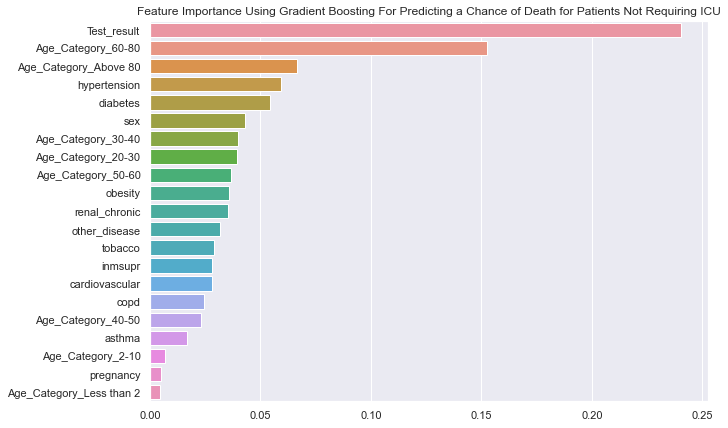

In [177]:
# get features importance
gbt_feature_importance = pd.Series(gbt_best_model.feature_importances_,index=X_train_NI.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = gbt_feature_importance, y = gbt_feature_importance.index)

plt.title("Feature Importance Using Gradient Boosting For Predicting a Chance of Death for Patients Not Requiring ICU")
plt.show()

Accuracy:  0.729975821801533


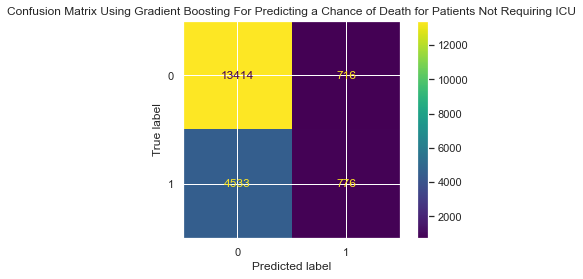

In [178]:
predictions_gbt = gbt_best_model.predict(X_test_NI)
predictions_prob_gbt = gbt_best_model.predict_proba(X_test_NI)[:, 1]
plot_confusion_matrix(gbt_best_model, X_test_NI, y_test_NI)
plt.title('Confusion Matrix Using Gradient Boosting For Predicting a Chance of Death for Patients Not Requiring ICU')
print('Accuracy: ',accuracy_score(y_test_NI, predictions_gbt))

In [179]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_gbt = accuracy_score(y_test_NI, predictions_gbt)
print("Accuracy : ", accuracy_gbt)
precision_gbt = precision_score(y_test_NI, predictions_gbt)
print("Precision : ", precision_gbt)
recall_gbt = recall_score(y_test_NI, predictions_gbt)
print("Recall : ", recall_gbt)
f1_score_gbt = f1_score(y_test_NI, predictions_gbt)
print("f-1 Score : ",f1_score_gbt)

Accuracy :  0.729975821801533
Precision :  0.5201072386058981
Recall :  0.146166886419288
f-1 Score :  0.22820173503896482


In [180]:
from sklearn import metrics
print(metrics.classification_report(y_test_NI, predictions_gbt))

              precision    recall  f1-score   support

           0       0.75      0.95      0.84     14130
           1       0.52      0.15      0.23      5309

    accuracy                           0.73     19439
   macro avg       0.63      0.55      0.53     19439
weighted avg       0.69      0.73      0.67     19439



In [181]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test_NI, predictions_prob_gbt)
auc_score_gbt = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_gbt)
gbt_precision, gbt_recall, _ = precision_recall_curve(y_test_NI, predictions_prob_gbt)
gbt_f1, gbt_score_PRC = f1_score(y_test_NI, predictions_gbt), auc(gbt_recall, gbt_precision)
print("AUC under PR Curve : ",gbt_score_PRC)

AUC under ROC :  0.6993791338587401
AUC under PR Curve :  0.4327790848145402


In [182]:
# ROC Curve

import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test_NI, predictions_prob_gbt)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Gradient Boosting For Predicting a Chance of Death for Patients Not Requiring ICU',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

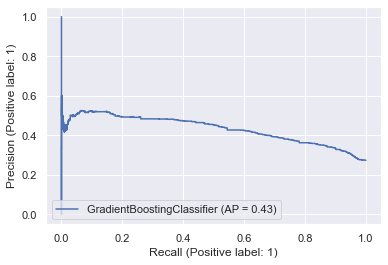

In [183]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(gbt_best_model, X_test_NI, y_test_NI)


precision, recall, thresholds = precision_recall_curve(y_test_NI, predictions_prob_gbt)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Gradient Boosting For Predicting a Chance of Death for Patients Not Requiring ICU',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

## Combining results into DF

In [184]:
# initialize list of lists
data_death_NI = [['Random Forest', accuracy_rf,precision_rf, recall_rf, f1_score_rf, auc_score_rf, rf_score_PRC], \
              ['Gradient Boosting Trees', accuracy_gbt,precision_gbt, recall_gbt, f1_score_gbt, auc_score_gbt, gbt_score_PRC]]\
        
  
# Create the pandas DataFrame
death_NI_df = pd.DataFrame(data_death_NI, columns = ['Model', 'Accuracy', 'Precision',  'Recall', 'F1Score', 'AreaROC', 'AreaPRCurve'])
  
# print dataframe.
death_NI_df

,Model,Accuracy,Precision,Recall,F1Score,AreaROC,AreaPRCurve
0,Random Forest,0.730645,0.556765,0.067433,0.120296,0.713313,0.451480
1,Gradient Boosting Trees,0.729976,0.520107,0.146167,0.228202,0.699379,0.432779


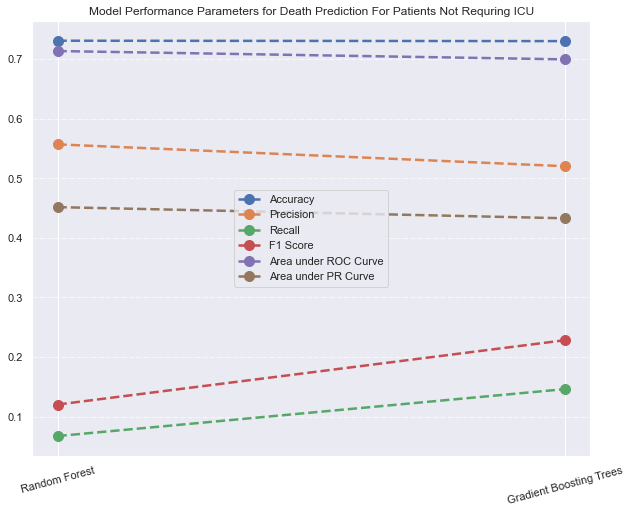

In [185]:
# plot lines
plt.figure(figsize=(10,8))
plt.plot(death_NI_df.Model, death_NI_df.Accuracy, label = "Accuracy", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(death_NI_df.Model, death_NI_df.Precision, label = "Precision", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(death_NI_df.Model, death_NI_df.Recall, label = "Recall", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(death_NI_df.Model, death_NI_df['F1Score'], label = "F1 Score", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.plot(death_NI_df.Model, death_NI_df.AreaROC, label = "Area under ROC Curve", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.plot(death_NI_df.Model, death_NI_df.AreaPRCurve, label = "Area under PR Curve", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.legend()
plt.xticks(rotation = 15) # Rotates X-Axis Ticks by 45-degrees
plt.grid(axis = 'y', linestyle='-.', linewidth=0.7)
plt.title('Model Performance Parameters for Death Prediction For Patients Not Requring ICU')
plt.show()

# Predicting Covid classification

In [186]:
X = df.drop(['id','patient_type','entry_date','date_symptoms','date_died','Count','Test_result'], axis = 'columns')
y = df.Test_result

In [187]:
# One hot encoding age feature

X = pd.get_dummies(X, drop_first=True)

In [188]:
X.head()

,sex,intubed,pneumonia,pregnancy,diabetes,copd,asthma,inmsupr,hypertension,other_disease,cardiovascular,obesity,renal_chronic,tobacco,icu,death,Age_Category_2-10,Age_Category_20-30,Age_Category_30-40,Age_Category_40-50,Age_Category_50-60,Age_Category_60-80,Age_Category_Above 80,Age_Category_Less than 2
2,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0
5,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [189]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=42)  # X_test is a hold out test set. 
# Hold out test set should not be used in Hyperparameter tuning.

### Logistic Regression

In [190]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import classification_report, plot_confusion_matrix, accuracy_score

In [191]:
def hypertuning(model, params, n_iter, X,y):
    print('Tuning Hyperparameters.....')
    randomSearch = RandomizedSearchCV(estimator=model, param_distributions=params, cv = 3, n_jobs=-1, \
                                      n_iter=n_iter) # 3 fold CV.
    randomSearch.fit(X,y) # Using train data with 3-fold cross validation to tune hyperparameters
    best_parameters = randomSearch.best_params_
    best_score = randomSearch.best_score_
    return best_parameters, best_score

In [192]:
%time lr_best_params, lr_best_score = hypertuning(log_reg, log_reg_params, n_iter = 4, X=X_train, y=y_train)

print(lr_best_params)
print(lr_best_score)

Tuning Hyperparameters.....
Wall time: 1.78 s
{'solver': 'saga', 'penalty': 'l2', 'l1_ratio': 0.01, 'C': 1.1}
0.6969693562389764


Accuracy:  0.6996036240090601


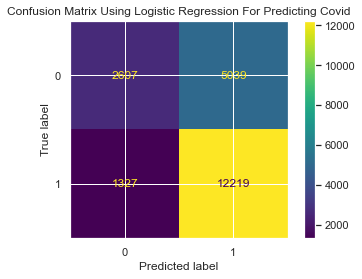

In [193]:
lr_best_model = LogisticRegression(penalty= 'l2' , C= 1.1 , solver= 'saga', l1_ratio= 1 , random_state = 42)
lr_best_model.fit(X_train, y_train)
predictions_lr = lr_best_model.predict(X_test)
predictions_prob_lr = lr_best_model.predict_proba(X_test)[:, 1]
plot_confusion_matrix(lr_best_model, X_test, y_test)
plt.title('Confusion Matrix Using Logistic Regression For Predicting Covid')
print('Accuracy: ',accuracy_score(y_test, predictions_lr))

In [194]:
lr_features = pd.DataFrame({"Feature":X_train.columns.tolist(),"Coefficients":np.exp(lr_best_model.coef_[0])}).sort_values(by = 'Coefficients',ascending = False)
lr_features

,Feature,Coefficients
20,Age_Category_50-60,5.531750
19,Age_Category_40-50,5.113548
21,Age_Category_60-80,4.732390
18,Age_Category_30-40,3.838274
22,Age_Category_Above 80,2.727845
15,death,2.438289
17,Age_Category_20-30,2.404202
2,pneumonia,1.461221
11,obesity,1.394189
1,intubed,1.051722


In [195]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_lr = accuracy_score(y_test, predictions_lr)
print("Accuracy : ", accuracy_lr)
precision_lr = precision_score(y_test, predictions_lr)
print("Precision : ", precision_lr)
recall_lr = recall_score(y_test, predictions_lr)
print("Recall : ", recall_lr)
f1_score_lr = f1_score(y_test, predictions_lr)
print("f-1 Score : ", f1_score_lr)

Accuracy :  0.6996036240090601
Precision :  0.7080194692316607
Recall :  0.9020375018455633
f-1 Score :  0.7933385274639657


In [196]:
from sklearn import metrics
print(metrics.classification_report(y_test, predictions_lr))

              precision    recall  f1-score   support

           0       0.66      0.34      0.45      7646
           1       0.71      0.90      0.79     13546

    accuracy                           0.70     21192
   macro avg       0.69      0.62      0.62     21192
weighted avg       0.69      0.70      0.67     21192



In [197]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test, predictions_prob_lr)
auc_score_lr = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_lr)
lr_precision, lr_recall, _ = precision_recall_curve(y_test, predictions_prob_lr)
lr_f1, lr_score_PRC = f1_score(y_test, predictions_lr), auc(lr_recall, lr_precision)
print("AUC under PR Curve : ",lr_score_PRC)

AUC under ROC :  0.7089417207133971
AUC under PR Curve :  0.7917505123066322


In [198]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test, predictions_prob_lr)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Logistic Regression For Predicting Covid',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

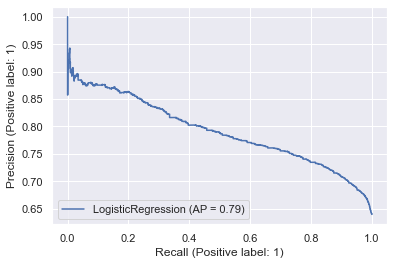

In [199]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(lr_best_model, X_test, y_test)


precision, recall, thresholds = precision_recall_curve(y_test, predictions_prob_lr)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Logistic Regression For Predicting Covid',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Decision Trees

In [200]:
%time dt_best_params, dt_best_score = hypertuning(dt, dt_params, n_iter = 4, X=X_train, y=y_train)

print(dt_best_params)
print(dt_best_score)

Tuning Hyperparameters.....
Wall time: 538 ms
{'splitter': 'random', 'max_features': 'auto', 'max_depth': 13, 'criterion': 'gini'}
0.6837920652855516


In [201]:
dt_best_model = DecisionTreeClassifier(splitter= 'random' , max_features= 'auto' , max_depth= 14, criterion= 'gini' , random_state = 42)
dt_best_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=14, max_features='auto', random_state=42,
                       splitter='random')

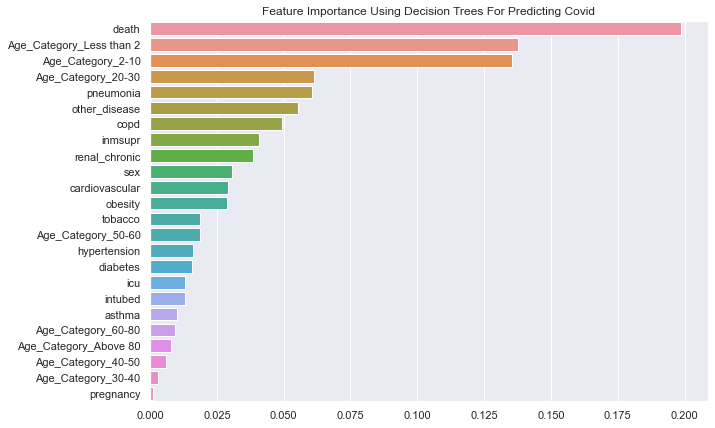

In [202]:
# get features importance
rf_feature_importance = pd.Series(dt_best_model.feature_importances_,index=X_train.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = rf_feature_importance, y = rf_feature_importance.index)

plt.title("Feature Importance Using Decision Trees For Predicting Covid")
plt.show()

Accuracy:  0.6904492261230654


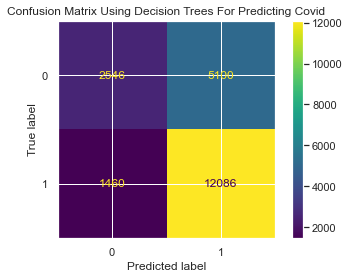

In [203]:
predictions_dt = dt_best_model.predict(X_test)
predictions_prob_dt = dt_best_model.predict_proba(X_test)[:, 1]
plot_confusion_matrix(dt_best_model, X_test, y_test)
plt.title('Confusion Matrix Using Decision Trees For Predicting Covid')
print('Accuracy: ',accuracy_score(y_test, predictions_dt))

In [204]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_dt = accuracy_score(y_test, predictions_dt)
print("Accuracy : ", accuracy_dt)
precision_dt = precision_score(y_test, predictions_dt)
print("Precision : ", precision_dt)
recall_dt = recall_score(y_test, predictions_dt)
print("Recall : ", recall_dt)
f1_score_dt = f1_score(y_test, predictions_dt)
print("f-1 Score : ",f1_score_dt)

Accuracy :  0.6904492261230654
Precision :  0.703246828814151
Recall :  0.8922191052709287
f-1 Score :  0.7865417154757256


In [205]:
from sklearn import metrics
print(metrics.classification_report(y_test, predictions_dt))

              precision    recall  f1-score   support

           0       0.64      0.33      0.44      7646
           1       0.70      0.89      0.79     13546

    accuracy                           0.69     21192
   macro avg       0.67      0.61      0.61     21192
weighted avg       0.68      0.69      0.66     21192



In [206]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test, predictions_prob_dt)
auc_score_dt = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_dt)
dt_precision, dt_recall, _ = precision_recall_curve(y_test, predictions_prob_dt)
dt_f1, dt_score_PRC = f1_score(y_test, predictions_dt), auc(dt_recall, dt_precision)
print("AUC under PR Curve : ",dt_score_PRC)

AUC under ROC :  0.6861554977471094
AUC under PR Curve :  0.7668809362650176


In [207]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test, predictions_prob_dt)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Decision Trees For Predicting Covid',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

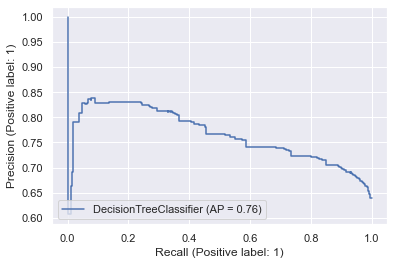

In [208]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(dt_best_model, X_test, y_test)


precision, recall, thresholds = precision_recall_curve(y_test, predictions_prob_dt)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Decision Trees For Predicting Covid',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Random Forest

In [209]:
%time rf_best_params, rf_best_score = hypertuning(rf, rf_params, n_iter = 4, X=X_train, y=y_train)

print(rf_best_params)
print(rf_best_score)

Tuning Hyperparameters.....
Wall time: 18.4 s
{'n_estimators': 200, 'max_features': 'auto', 'max_depth': 13, 'criterion': 'gini'}
0.6928521952371285


In [210]:
rf_best_model = RandomForestClassifier(n_estimators= 200 , max_features= 'auto' , max_depth= 11, criterion= 'gini' , random_state = 42)
rf_best_model.fit(X_train, y_train)

RandomForestClassifier(max_depth=11, n_estimators=200, random_state=42)

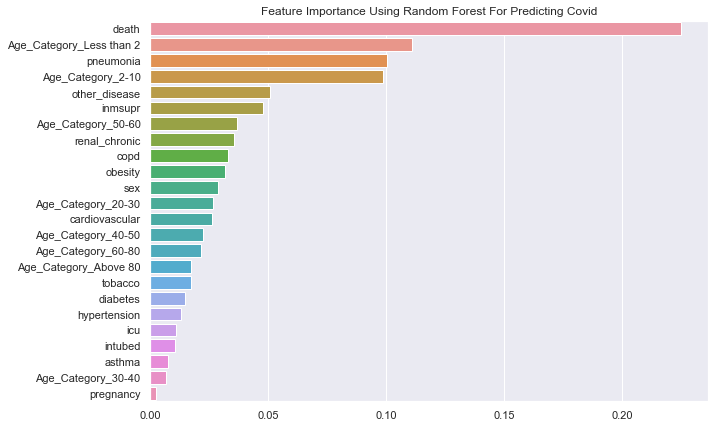

In [211]:
# get features importance
rf_feature_importance = pd.Series(rf_best_model.feature_importances_,index=X_train.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = rf_feature_importance, y = rf_feature_importance.index)

plt.title("Feature Importance Using Random Forest For Predicting Covid")
plt.show()

Accuracy:  0.6950736126840317


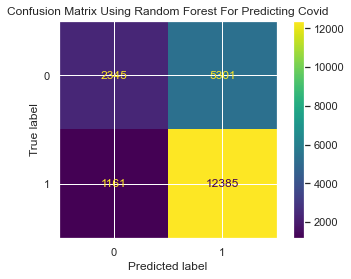

In [212]:
predictions_rf = rf_best_model.predict(X_test)
predictions_prob_rf = rf_best_model.predict_proba(X_test)[:, 1]
plot_confusion_matrix(rf_best_model, X_test, y_test)
plt.title('Confusion Matrix Using Random Forest For Predicting Covid')
print('Accuracy: ',accuracy_score(y_test, predictions_rf))

In [213]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy_rf = accuracy_score(y_test, predictions_rf)
print("Accuracy : ", accuracy_rf)
precision_rf = precision_score(y_test, predictions_rf)
print("Precision : ", precision_rf)
recall_rf = recall_score(y_test, predictions_rf)
print("Recall : ", recall_rf)
f1_score_rf = f1_score(y_test, predictions_rf)
print("f-1 Score : ",f1_score_rf)

Accuracy :  0.6950736126840317
Precision :  0.7002714011082212
Recall :  0.9142920419311974
f-1 Score :  0.7930968237704918


In [214]:
from sklearn import metrics
print(metrics.classification_report(y_test, predictions_rf))

              precision    recall  f1-score   support

           0       0.67      0.31      0.42      7646
           1       0.70      0.91      0.79     13546

    accuracy                           0.70     21192
   macro avg       0.68      0.61      0.61     21192
weighted avg       0.69      0.70      0.66     21192



In [215]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test, predictions_prob_rf)
auc_score_rf = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_rf)
rf_precision, rf_recall, _ = precision_recall_curve(y_test, predictions_prob_rf)
rf_f1, rf_score_PRC = f1_score(y_test, predictions_rf), auc(rf_recall, rf_precision)
print("AUC under PR Curve : ",rf_score_PRC)

AUC under ROC :  0.7073353999908625
AUC under PR Curve :  0.7922077253146134


In [216]:
# ROC Curve

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test, predictions_prob_rf)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Random Forest For Predicting Covid',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

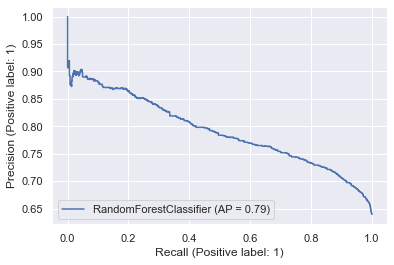

In [217]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(rf_best_model, X_test, y_test)


precision, recall, thresholds = precision_recall_curve(y_test, predictions_prob_rf)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Random Forest For Predicting Covid',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

### Gradient Boosting

In [218]:
%time gbt_best_params, gbt_best_score = hypertuning(gbt, gbt_params, n_iter = 4, X=X_train, y=y_train)

print(gbt_best_params)
print(gbt_best_score)

Tuning Hyperparameters.....
Wall time: 8.85 s
{'max_features': 'sqrt', 'max_depth': 8, 'loss': 'deviance', 'learning_rate': 0.05, 'criterion': 'friedman_mse'}
0.6956008919369979


In [219]:
gbt_best_model = GradientBoostingClassifier( max_features= 'auto' , max_depth= 8, criterion= 'friedman_mse', loss ='deviance', learning_rate = 0.05, random_state = 42)
gbt_best_model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.05, max_depth=8, max_features='auto',
                           random_state=42)

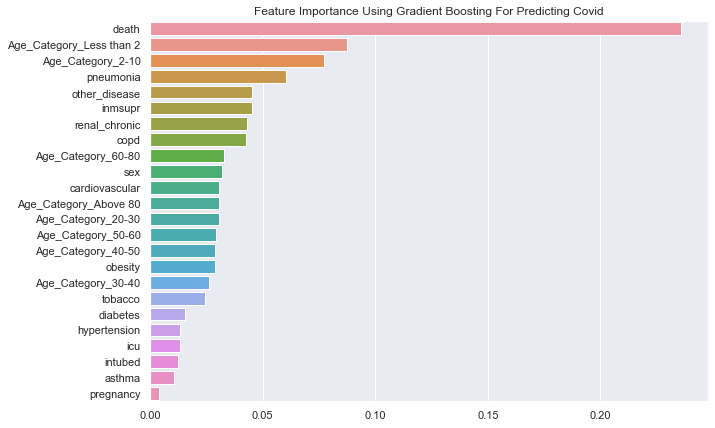

In [220]:
# get features importance
gbt_feature_importance = pd.Series(gbt_best_model.feature_importances_,index=X_train.columns).sort_values(ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(x = gbt_feature_importance, y = gbt_feature_importance.index)

plt.title("Feature Importance Using Gradient Boosting For Predicting Covid")
plt.show()

Accuracy:  0.6969611174027935


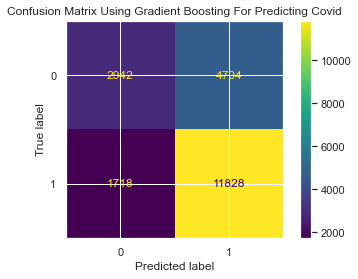

In [221]:
predictions_gbt = gbt_best_model.predict(X_test)
predictions_prob_gbt = gbt_best_model.predict_proba(X_test)[:, 1]
plot_confusion_matrix(gbt_best_model, X_test, y_test)
plt.title('Confusion Matrix Using Gradient Boosting For Predicting Covid')
print('Accuracy: ',accuracy_score(y_test, predictions_gbt))

In [222]:
# Classification Report and metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy_gbt = accuracy_score(y_test, predictions_gbt)
print("Accuracy : ", accuracy_gbt)
precision_gbt = precision_score(y_test, predictions_gbt)
print("Precision : ", precision_gbt)
recall_gbt = recall_score(y_test, predictions_gbt)
print("Recall : ", recall_gbt)
f1_score_gbt = f1_score(y_test, predictions_gbt)
print("f-1 Score : ",f1_score_gbt)

Accuracy :  0.6969611174027935
Precision :  0.7154609242680862
Recall :  0.8731728923667503
f-1 Score :  0.7864884633286789


In [223]:
from sklearn import metrics
print(metrics.classification_report(y_test, predictions_gbt))

              precision    recall  f1-score   support

           0       0.63      0.38      0.48      7646
           1       0.72      0.87      0.79     13546

    accuracy                           0.70     21192
   macro avg       0.67      0.63      0.63     21192
weighted avg       0.69      0.70      0.68     21192



In [224]:
from sklearn.metrics import roc_auc_score,auc
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test, predictions_prob_gbt)
auc_score_gbt = auc(fpr, tpr)
print("AUC under ROC : ",auc_score_gbt)
gbt_precision, gbt_recall, _ = precision_recall_curve(y_test, predictions_prob_gbt)
gbt_f1, gbt_score_PRC = f1_score(y_test, predictions_gbt), auc(gbt_recall, gbt_precision)
print("AUC under PR Curve : ",gbt_score_PRC)

AUC under ROC :  0.7101241170502857
AUC under PR Curve :  0.7935738205155592


In [225]:
# ROC Curve

import plotly.express as px

fpr, tpr, thresholds = roc_curve(y_test, predictions_prob_gbt)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f}) Using Gradient Boosting For Predicting Covid',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

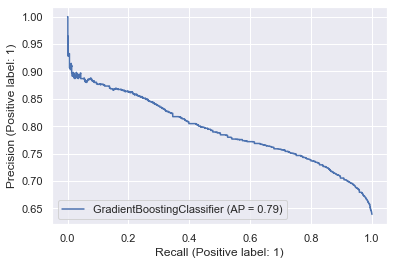

In [226]:
# Precision Recall Curve

from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

disp = plot_precision_recall_curve(gbt_best_model, X_test, y_test)


precision, recall, thresholds = precision_recall_curve(y_test, predictions_prob_gbt)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={auc(recall, precision):.4f}) Using Gradient Boosting For Predicting Covid',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

# Combining results into DF

In [227]:
# initialize list of lists
data_covid = [['Logistic Regression', accuracy_lr,precision_lr, recall_lr, f1_score_lr, auc_score_gbt, gbt_score_PRC], \
              ['Decision Trees', accuracy_dt,precision_dt, recall_dt, f1_score_dt, auc_score_dt, dt_score_PRC],\
              ['Random Forest', accuracy_rf,precision_rf, recall_rf, f1_score_rf, auc_score_rf, rf_score_PRC], \
              ['Gradient Boosting Trees', accuracy_gbt,precision_gbt, recall_gbt, f1_score_gbt, auc_score_gbt, gbt_score_PRC]]\
        
  
# Create the pandas DataFrame
results_df = pd.DataFrame(data_covid, columns = ['Model', 'Accuracy', 'Precision',  'Recall', 'F1Score', 'AreaROC', 'AreaPRCurve'])
  
# print dataframe.
results_df

,Model,Accuracy,Precision,Recall,F1Score,AreaROC,AreaPRCurve
0,Logistic Regression,0.699604,0.708019,0.902038,0.793339,0.710124,0.793574
1,Decision Trees,0.690449,0.703247,0.892219,0.786542,0.686155,0.766881
2,Random Forest,0.695074,0.700271,0.914292,0.793097,0.707335,0.792208
3,Gradient Boosting Trees,0.696961,0.715461,0.873173,0.786488,0.710124,0.793574


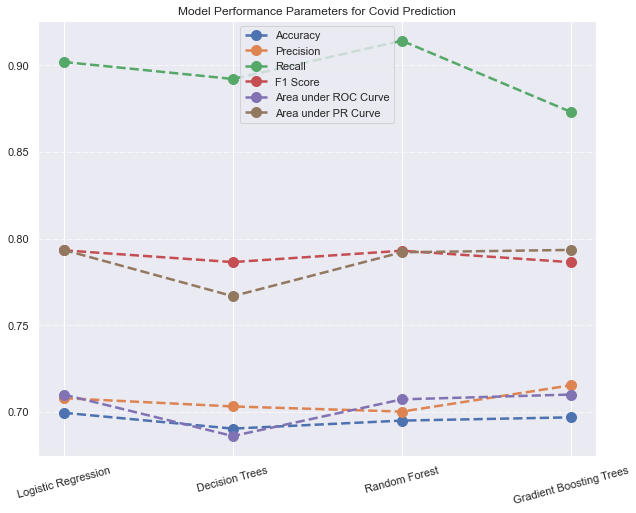

In [228]:
# plot lines
plt.figure(figsize=(10,8))
plt.plot(results_df.Model, results_df.Accuracy, label = "Accuracy", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(results_df.Model, results_df.Precision, label = "Precision", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(results_df.Model, results_df.Recall, label = "Recall", linestyle="--", linewidth=2.5, marker = 'o', markersize=10)
plt.plot(results_df.Model, results_df['F1Score'], label = "F1 Score", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.plot(results_df.Model, results_df.AreaROC, label = "Area under ROC Curve", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.plot(results_df.Model, results_df.AreaPRCurve, label = "Area under PR Curve", linestyle='--', linewidth=2.5, marker = 'o', markersize=10)
plt.legend()
plt.xticks(rotation = 15) # Rotates X-Axis Ticks by 45-degrees
plt.grid(axis = 'y', linestyle='-.', linewidth=0.7)
plt.title('Model Performance Parameters for Covid Prediction')
plt.show()

# Conclusion and Suggestions:



The exploratory analysis and the model evaluation results led us to actionable insights in order to decide whether a patient needs to be given ICU or not considering the reasons that had caused fatality and the importance of Covid and other pre-conditions to get to that result.
If any patient is hospitalized with a positive test result, he should be given ICU urgently if they have pneumonia or they are infants. 


- Large number of deaths are caused by COVID instead of other comorbidities.


- Patients in the age range of 0 to 10 and in the age range of 50 to 60 are more prone to Covid if they are suffering from medical preconditions such as pneumonia, immunosuppression and other diseases.


- Mortality rate among patients who were hospitalized the day they started showing symptoms is higher, maybe due to higher severity of Covid than other pre-conditions based on the feature Importance. 


- The longer patients are in the hospital the mortality rate is reducing. It is likely that the medical care given was working.
